In [1]:
from ema_workbench.analysis import parcoords
from ema_workbench.analysis import clusterer, plotting, Density

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\prim.py:30: ImportWarning: altair based interactive inspection not available
  warnings.warn(("altair based interactive "


In [2]:
import plotly.graph_objects as go

In [3]:
import math
from scipy.stats import norm, skewnorm, cauchy, lognorm
import logging
import json
import sys
import os

import xlwt
import xlsxwriter
from tempfile import TemporaryFile
import time

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import itertools

#%matplotlib inline
clr_palette = ([sns.color_palette("YlGn", 15)[10],sns.cubehelix_palette(8)[6]])

pydice_folder = os.path.dirname(os.getcwd()) + '\\1_Model'
sys.path.append(pydice_folder)

from SALib.analyze import sobol

from ema_workbench import (Model, MultiprocessingEvaluator, Policy, Scenario)
from ema_workbench.analysis import parcoords

from ema_workbench.em_framework.evaluators import perform_experiments, LHS, SOBOL, MORRIS
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench.em_framework.samplers import sample_uncertainties
from ema_workbench.analysis import feature_scoring
# from ema_workbench.analysis.scenario_discovery_util import CLASSIFICATION, REGRESSION

from ema_workbench.util import ema_logging
from ema_workbench import (perform_experiments, Model, Policy, Scenario, ReplicatorModel, RealParameter, IntegerParameter, ScalarOutcome, ArrayOutcome, 
                           Constant, ema_logging, SequentialEvaluator, MultiprocessingEvaluator, IpyparallelEvaluator)
ema_logging.log_to_stderr(ema_logging.INFO)

from PyRICE_V8 import PyRICE

In [4]:
nordhaus_policy = pd.read_excel("results_nordhaus_policy.xlsx")
nordhaus_policy = nordhaus_policy.drop(nordhaus_policy.columns[0], axis=1)

In [5]:
RICE_POP_gr = pd.read_excel("RICE_2010_base_000.xlsm", sheet_name="Pop_gr")

regions_list = ["US", "OECD-Europe","Japan","Russia","Non-Russia Eurasia","China","India","Middle East","Africa",
    "Latin America","OHI","Other non-OECD Asia"]

"""
####################### Population PARAMETERS and set up dataframe format #######################
"""

#get population growth rates for each region
a=[]
for i in range(31):  
    if i == 0:
        a.append("region")
    k = 2005 + 10 * i
    k = str(k)
    a.append(k)    

region_pop_gr = RICE_POP_gr.iloc[10:22,3:35]
region_pop_gr.columns =  a
region_pop_gr = region_pop_gr.set_index('region') 

In [6]:
model = PyRICE(model_specification="EMA",welfare_function="utilitarian")
RICE = Model('RICE', function = model)

In [7]:
RICE.uncertainties =[IntegerParameter('fdamage',0,1),
                     IntegerParameter('scenario_pop_tfp',0,5),
                     IntegerParameter('scenario_sigma',0,5),
                     IntegerParameter('scenario_cback',0,2),
                         
                     IntegerParameter('cback_to_zero',0,1),
                     RealParameter('fosslim', 4000, 13649),
                     RealParameter('limmiu',0.8,1.2)] 
                        
RICE.levers = [RealParameter('sr', 0.1, 0.5),
               RealParameter('irstp',  0.001, 0.015),
               IntegerParameter('miu_period', 10, 30),
               
               IntegerParameter('sufficitarian_discounting', 0,1), 
               RealParameter('growth_factor_suf',1,1.04),
               RealParameter('ini_suf_treshold',0.7,1.4)]

RICE.outcomes =[ScalarOutcome('Atmospheric Temperature 2055', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Industrial Emission 2055', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Distance to treshold 2055', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Population under treshold 2055', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Utility 2055', ScalarOutcome.MAXIMIZE), 
                
                ScalarOutcome('Atmospheric Temperature 2105', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Industrial Emission 2105', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Distance to treshold 2105', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Population under treshold 2105', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Utility 2105', ScalarOutcome.MAXIMIZE),      
                
                ScalarOutcome('Atmospheric Temperature 2155', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Industrial Emission 2155', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Distance to treshold 2155', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Population under treshold 2155', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Utility 2155', ScalarOutcome.MAXIMIZE),
                
                ScalarOutcome('Atmospheric Temperature 2205', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Industrial Emission 2205', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Distance to treshold 2205', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Population under treshold 2205', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Utility 2205', ScalarOutcome.MAXIMIZE),  
                
                ScalarOutcome('Atmospheric Temperature 2305', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Industrial Emission 2305', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Distance to treshold 2305', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Population under treshold 2305', ScalarOutcome.MINIMIZE),
                ScalarOutcome('Utility 2305', ScalarOutcome.MAXIMIZE),
                ScalarOutcome('Total Aggregated Utility',ScalarOutcome.MAXIMIZE)
               ]

In [8]:
results_suf = pd.read_csv("results_sufficitarian_rerun.csv")
con_suf = pd.read_csv("con_suffici_policy_gen_reference_scenario_0.csv")
results_ega = pd.read_csv("results_egalitarian_policy_gen.csv")
con_ega =  pd.read_csv("con_egalitarian_policy_gen_0.001.csv")
results_util= pd.read_csv("results_utilitarian_rerun.csv")
con_util =  pd.read_csv("con_utilitarian_policy_gen_reference_scenario_0.csv")
results_prio= pd.read_csv("results_prioritarian_policy_gen.csv")
con_prio =  pd.read_csv("con_prioritarian_policy_gen_0.01.csv")

classify runs on the basis of the principle used

In [9]:
#classify utilitarian runs
results_util['principle'] = np.where(results_util['irstp']<0.005, '0', '1')

#classify prioritarian runs
results_prio['principle'] = np.where(results_prio['prioritarian_discounting']==0, 'no discounting', 'conditional discounting')

#classify sufficitarian runs
results_suf['principle'] = np.where(results_suf['sufficitarian_discounting']==0, 'equal inheritance discounting', 'growth discounting')

#classify egalitarian runs
results_ega['principle'] = np.where(results_ega['egalitarian_discounting']==0, 'equality across generations', 'no discounting + equality')

In [10]:
sns.set(font_scale=1.25)  # crazy big
sns.set_style("whitegrid")

## Convergence plots of each generation

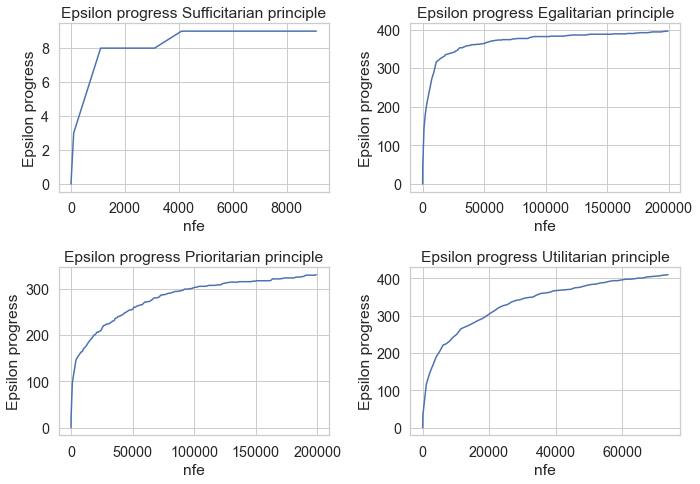

In [11]:
convergence_suf = con_suf
convergence_ega = con_ega
convergence_prio = con_prio
convergence_util = con_util
sns.set(font_scale=1.3)  # crazy big
sns.set_style("whitegrid")

fig, (ax1,ax2) = plt.subplots(2,2, figsize=(10,7),tight_layout=True)
sns.lineplot(data= convergence_suf, x='nfe',y='epsilon_progress',ax = ax1[0])
sns.lineplot(data= convergence_ega, x='nfe',y='epsilon_progress',ax = ax1[1])
sns.lineplot(data= convergence_prio, x='nfe',y='epsilon_progress',ax = ax2[0])
sns.lineplot(data= convergence_util, x='nfe',y='epsilon_progress',ax = ax2[1])

ax1[0].set_title('Epsilon progress Sufficitarian principle')
ax1[1].set_title('Epsilon progress Egalitarian principle')
ax2[0].set_title('Epsilon progress Prioritarian principle')
ax2[1].set_title('Epsilon progress Utilitarian principle')

ax1[0].set(xlabel='nfe', ylabel='Epsilon progress')
ax2[0].set(xlabel='nfe', ylabel='Epsilon progress')
ax1[1].set(xlabel='nfe', ylabel='Epsilon progress')
ax2[1].set(xlabel='nfe', ylabel='Epsilon progress')

plt.show()
fig.savefig('Convergence plots of policy generation', bbox_inches='tight',dpi=220)


#### ega

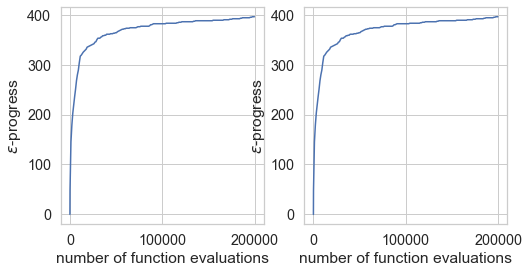

In [12]:
convergence = con_ega

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, figsize=(8,4))
ax1.plot(convergence.nfe, convergence.epsilon_progress)
ax1.set_ylabel('$\epsilon$-progress')
ax2.plot(convergence.nfe, convergence.epsilon_progress)
ax2.set_ylabel('$\epsilon$-progress')

ax1.set_xlabel('number of function evaluations')
ax2.set_xlabel('number of function evaluations')
plt.show()

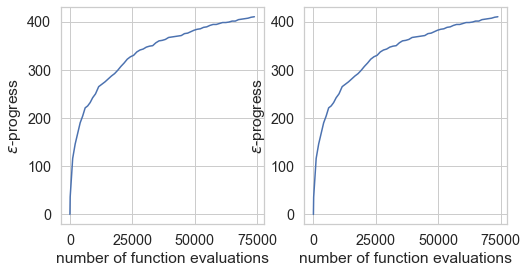

In [13]:
convergence = con_util

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, figsize=(8,4))
ax1.plot(convergence.nfe, convergence.epsilon_progress)
ax1.set_ylabel('$\epsilon$-progress')
ax2.plot(convergence.nfe, convergence.epsilon_progress)
ax2.set_ylabel('$\epsilon$-progress')

ax1.set_xlabel('number of function evaluations')
ax2.set_xlabel('number of function evaluations')
plt.show()

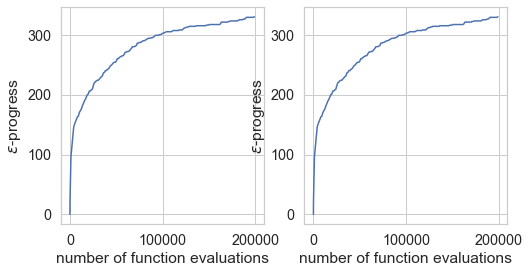

In [14]:
convergence = con_prio

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, figsize=(8,4))
ax1.plot(convergence.nfe, convergence.epsilon_progress)
ax1.set_ylabel('$\epsilon$-progress')
ax2.plot(convergence.nfe, convergence.epsilon_progress)
ax2.set_ylabel('$\epsilon$-progress')

ax1.set_xlabel('number of function evaluations')
ax2.set_xlabel('number of function evaluations')
plt.show()

## Policy results

##### Utilitarian

In [15]:
results_util = results_util.sort_values(by=['Total Aggregated Utility'],ascending = False)
print(len(results_util))
#select top 50 policies based on aggregated utility
results_util = results_util.iloc[0:50,:]

882


In [16]:
policy_list_util= [("policy 370","util0"),("policy 132","util0"),
                   ("policy 79","util1"),("policy 417","util1"),("policy 857","util1")]

In [17]:
RICE.levers = [RealParameter('sr', 0.1, 0.5),
               RealParameter('irstp', 0.001, 0.015),
               IntegerParameter('miu_period', 10, 30)]

#Extract levers from results
data = results_util.iloc[:,1:]
data=data.rename(columns = {'sr':'Savings Rate', 'irstp':'Social Time Preference', 'miu_period':'Emission Control Rate Target'})
data = data.iloc[:,0:3]

data['highlight'] = 0
data["principle"] = ""

data.loc[data["Social Time Preference"] > 0.005, 'principle'] = 0
data.loc[data["Social Time Preference"] < 0.005, 'principle'] = 1

for policy in range(len(policy_list_util)):
    policy_index = policy_list_util[policy][0][-3:]
    data['highlight'].loc[int(policy_index)] = 1

C:\Users\ivart\anaconda3\lib\site-packages\pandas\core\indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [18]:
policy_list_util= [("policy 370","util0"),("policy 132","util0"),
                   ("policy 79","util1"),("policy 417","util1"),("policy 857","util1")]

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


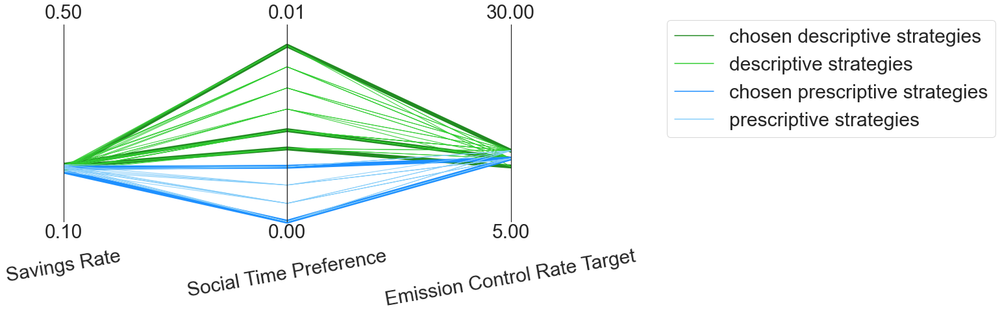

In [19]:
#Rename columns
pollimits = pd.DataFrame({"Savings Rate":[0.1,0.5], 'Social Time Preference':[0.001, 0.015], 
                          'Emission Control Rate Target':[5, 30]})

labels = ["chosen descriptive strategies","descriptive strategies","chosen prescriptive strategies",
          "prescriptive strategies"]

paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=10, fontsize=30)
paraxes.fig.set_size_inches(14,7)

index1 = [0,0,1,1]
index2 = [1,0,1,0]

for policy in range(0,4):
    data_to_plot = data[(data['principle'] ==(index1[policy])) & (data['highlight'] ==index2[policy]) ]
    if (index1[policy] == 0 and index2[policy]==0):
        color = "limegreen"
        size = 1
    if (index1[policy] == 0 and index2[policy]==1):
        color = "forestgreen"
        size = 6
        
    if (index1[policy] == 1 and index2[policy]==0):
        color = "lightskyblue"
        size = 1
    if (index1[policy] == 1 and index2[policy]==1):
        color = "dodgerblue"
        size = 6

    paraxes.plot(data_to_plot,color = color,linewidth=size, label = labels[policy])

paraxes.legend()
paraxes.fig.savefig("chosen_policies_utilitarian.png", bbox_inches='tight')
plt.show()

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


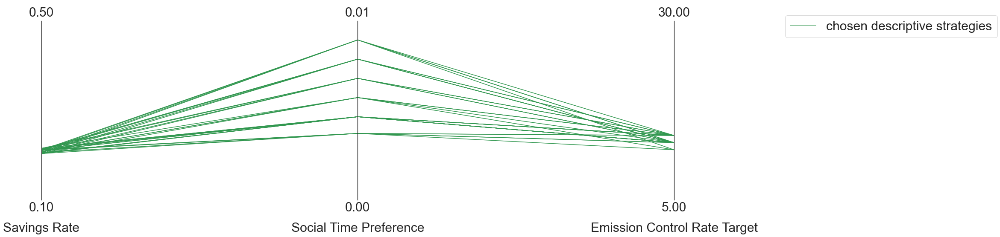

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


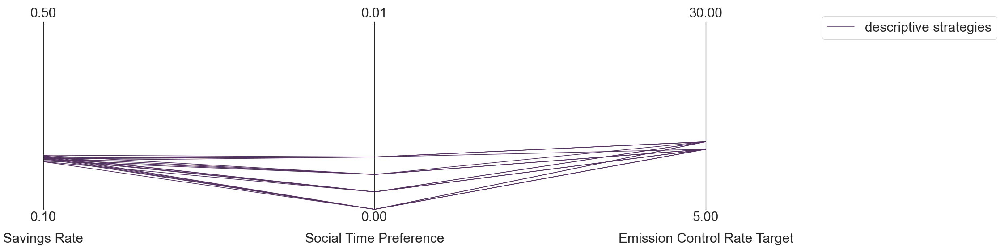

In [20]:
for i in range(0,2):
    paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=0, fontsize=30)
    paraxes.fig.set_size_inches(25,8)
    data_to_plot = data[data['principle']==i]
    paraxes.plot(data_to_plot,color = clr_palette[i], label = labels[i])

    paraxes.legend()
    # cf.change_fontsize(paraxes, fs=24)
    #paraxes.fig.savefig("plot_policies_V4.png", bbox_inches='tight')
    plt.show()

- all graphs similar savings rate and emisison control rate
- influence of irstp on outcomes seems limited interestingly enough
- pick graphs with equal spread based on miu and social time preference for both descriptive als the prescriptive case

#### graph 1
- policy 370 --> very low irstp
- policy 132 --> high irstp

#### graph 2
- policy 79 medium irstp
- policy 417 high irstp
- policy 857 in between


In [21]:
policy_list_util= [("policy 370","util0"),("policy 132","util0"),
                   ("policy 79","util1"),("policy 417","util1"),("policy 857","util1")]

##### Prioritarian

In [22]:
clr_palette = ([(0.66,0.66,0.66),sns.color_palette("inferno", 15)[-3],sns.color_palette("YlGn", 10)[-4],
                sns.color_palette("viridis", 10)[3],sns.cubehelix_palette(10)[5]])

In [23]:
data = results_prio.iloc[:,1:6]

In [24]:
policy_list_prio= [("policy 11","prio0"),("policy 28","prio0"),("policy 33","prio0"),("policy 26","prio0"),
                   ("policy 49","prio1"),("policy 19","prio1"),("policy 1","prio1"),("policy 15","prio1")]

data = results_prio.iloc[:,1:6]
data=data.rename(columns = {'sr':'Savings Rate', 'irstp':'Social Time Preference', 
                            'miu_period':'Emission Control Rate Target','growth_factor_prio':'Growth factor',
                            'prioritarian_discounting':'Prioritarian discounting'})

#extract levers from results
data['principle'] = list(data['Prioritarian discounting'])
data['highlight'] = 0

for policy in range(len(policy_list_prio)):
    policy_index = policy_list_prio[policy][0][-2:]
    data['highlight'].loc[int(policy_index)] = 1

C:\Users\ivart\anaconda3\lib\site-packages\pandas\core\indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [25]:
data.loc[(data.principle == 1),'Social Time Preference']=0


C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


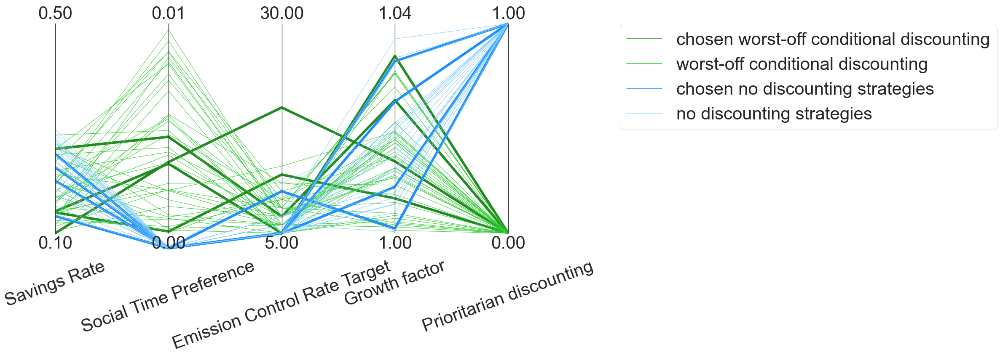

In [27]:
pollimits = pd.DataFrame({"Savings Rate":[0.1,0.5], 'Social Time Preference':[0.001, 0.015], 
                          'Emission Control Rate Target':[5, 30], 'Growth factor':[1, 1.04], 
                          'Prioritarian discounting':[0, 1]})

labels = ["chosen worst-off conditional discounting","worst-off conditional discounting",
          "chosen no discounting strategies", "no discounting strategies"]

paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=20, fontsize=42)
paraxes.fig.set_size_inches(20,12)

index1 = [0,0,1,1]
index2 = [1,0,1,0]

for policy in range(0,4):
    data_to_plot = data[(data['principle'] == index1[policy]) & (data['highlight'] ==index2[policy]) ]
    if (index1[policy] == 0 and index2[policy]==0):
        color = "limegreen"
        size = 1
    if (index1[policy] == 0 and index2[policy]==1):
        color = "forestgreen"
        size = 6
        
    if (index1[policy] == 1 and index2[policy]==0):
        color = "lightskyblue"
        size = 1
    if (index1[policy] == 1 and index2[policy]==1):
        color = "dodgerblue"
        size = 6
    paraxes.plot(data_to_plot,color = color,linewidth=size, label = labels[policy])



paraxes.legend()

paraxes.fig.savefig("chosen_policies_prioritarian.png", bbox_inches='tight')

plt.show()

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


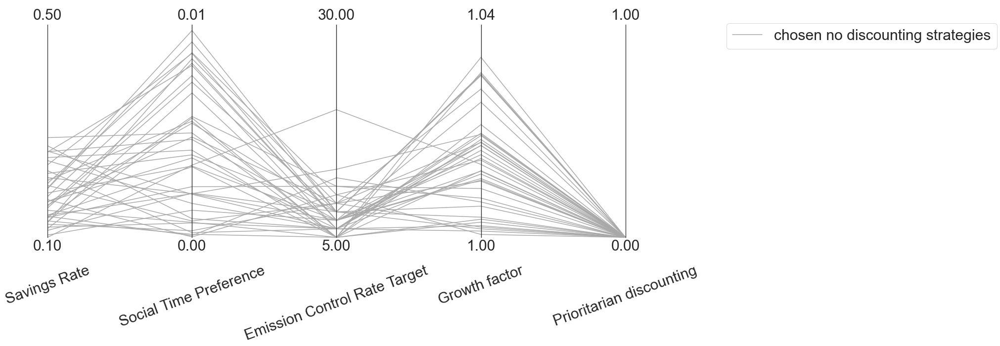

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


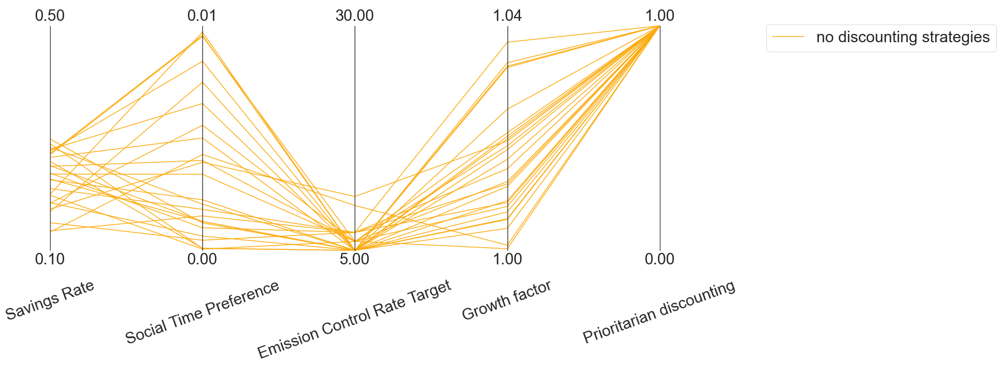

In [139]:
for i in range(0,2):
    paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=20, fontsize=30)
    paraxes.fig.set_size_inches(20,10)

    data_to_plot = data[data['Prioritarian discounting']==i]
    paraxes.plot(data_to_plot,color = clr_palette[i], label = labels[i])
    paraxes.legend()

    plt.show()

#### graph 1 
- savings rate concentrated low to medium values --> pick on interval 
- miu --> very fast abatement 3 low values 1 high
- one low growth two medium one high

policies matching thesse criteria
+ policy 11
+ policy 28
+ policy 33
+ policy 26


#### graph 2
- savings rate concentrated low to medium values --> pick on interval 
- irstp well spread -> pick interval
- miu --> very fast abatement 3 low values 1 high
- one low growth two medium one high

policies that match
+ policy 49
+ policy 19
+ policy 1
+ policy 15

In [140]:
policy_list_prio= [("policy 11","prio0"),("policy 28","prio0"),("policy 33","prio0"),("policy 26","prio0"),
                   ("policy 49","prio1"),("policy 19","prio1"),("policy 1","prio1"),("policy 15","prio1")]

##### Sufficitarian

#### results rerun sufficitarian

Forced spread of growth factor and sufficitarian treshold by changing a reference scenario

In [141]:
results = results_suf

policy_list_suf = [("policy 0","suf0"),("policy 29","suf0"),("policy 30","suf0"),("policy 10","suf0"),
                   ("policy 6","suf1"),("policy 35","suf1"),("policy 13","suf1"),("policy 11","suf1")]
#extract levers from results
results=results.rename(columns = {'sufficitarian growth factor':'growth_factor_suf',
                                  'sufficitarian_discounting':'sufficitarian_discounting',
                                  'treshold level': 'ini_suf_treshold'})
data = results.iloc[:,2:8]

data=data.rename(columns = {'sr':'Savings Rate', 'irstp':'Social Time Preference',
                            'miu_period':'Emission Control Rate Target',
                            'growth_factor_suf':'Growth factor',
                            'sufficitarian_discounting':'Sufficitarian discounting',
                            'ini_suf_treshold': 'Sufficitarian Treshold'})

#extract levers from results
data['principle'] = list(results_suf['sufficitarian_discounting'])
data['highlight'] = 0

for policy in range(len(policy_list_suf)):
    policy_index = policy_list_suf[policy][0][-2:]
    data['highlight'].loc[int(policy_index)] = 1

C:\Users\ivart\anaconda3\lib\site-packages\pandas\core\indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout(h_pad=0, w_pad=0)


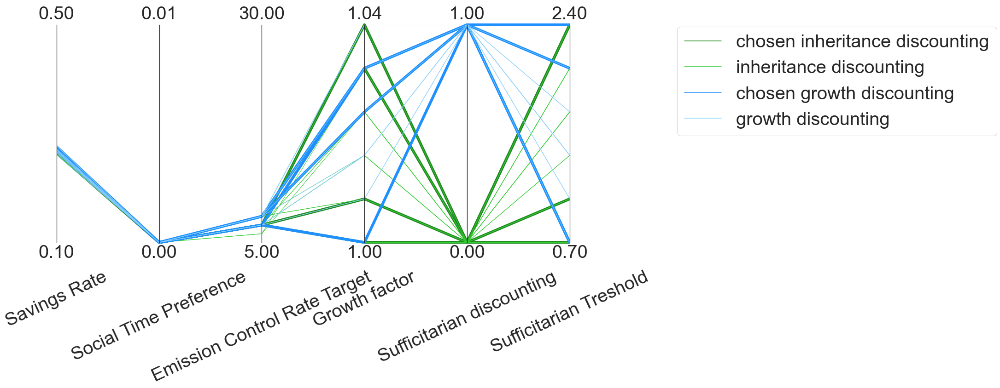

In [142]:
pollimits = pd.DataFrame({"Savings Rate":[0.1,0.5], 'Social Time Preference':[0.001, 0.015], 
                          'Emission Control Rate Target':[5, 30],
                          'Growth factor':[1,1.04],'Sufficitarian discounting': [0,1], 'Sufficitarian Treshold': [0.7, 2.4]})

labels = ["chosen inheritance discounting","inheritance discounting","chosen growth discounting","growth discounting"]

paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=25, fontsize=40)
paraxes.fig.set_size_inches(20,12)

index1 = [0,0,1,1]
index2 = [1,0,1,0]

for policy in range(0,4):
    data_to_plot = data[(data['principle'] == index1[policy]) & (data['highlight'] ==index2[policy]) ]
    if (index1[policy] == 0 and index2[policy]==0):
        color = "limegreen"
        size = 1
    if (index1[policy] == 0 and index2[policy]==1):
        color = "forestgreen"
        size = 6
        
    if (index1[policy] == 1 and index2[policy]==0):
        color = "lightskyblue"
        size = 1
    if (index1[policy] == 1 and index2[policy]==1):
        color = "dodgerblue"
        size = 6
    paraxes.plot(data_to_plot,color = color,linewidth=size, label = labels[policy])

paraxes.legend()
plt.show()
paraxes.fig.savefig("chosen_policies_sufficitarian.png", bbox_inches='tight')


C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


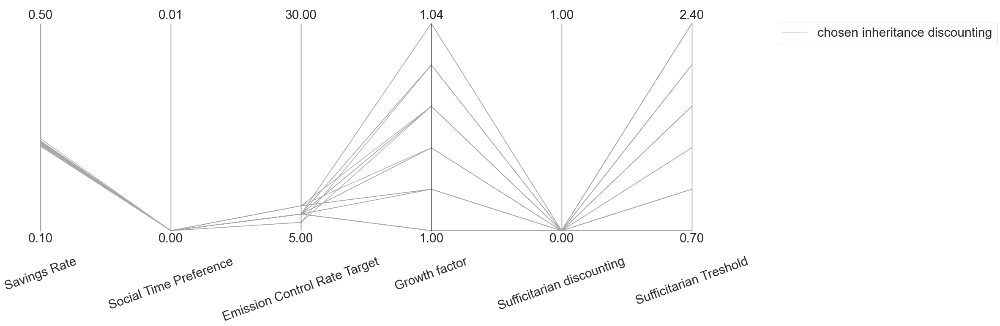

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


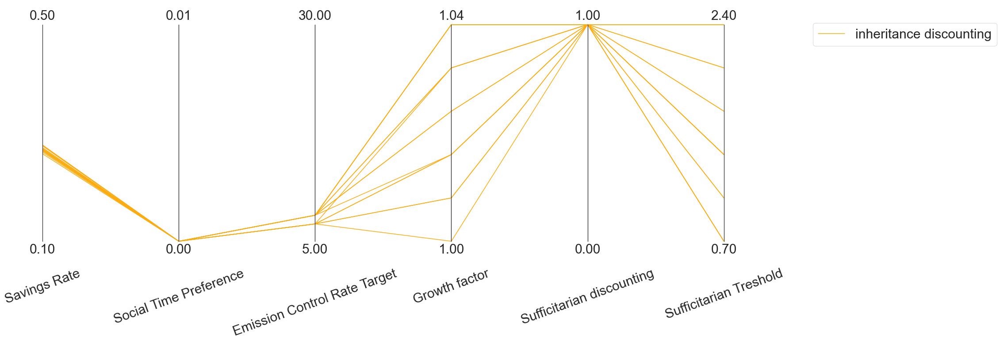

In [143]:
for i in range(0,2):
    paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=20, fontsize=30)
    paraxes.fig.set_size_inches(25,11)
    data_to_plot = data[data['Sufficitarian discounting']==i]
    paraxes.plot(data_to_plot,color = clr_palette[i], label = labels[i])
    
    paraxes.legend()
    # cf.change_fontsize(paraxes, fs=24)
    #paraxes.fig.savefig("plot_policies_V4.png", bbox_inches='tight')
    plt.show()

#### graph 1 
+ savings rate and irstp are very similar
+ pick spread on miu
+ pick interval on growth and threshold

policies that match
+ policy 0 - high tresh high growth
+ policy 29 - low tresh low growth
+ policy 30 - high tresh low growth
+ policy 10 - low tresh high growth

#### graph 2
+ idem savings rate and irstp are very similar
+ idem pick spread on miu
+ idem pick interval on growth and threshold

policies that match:
+ policy 6 - high tresh high growth
+ policy 35 - low tresh low growth
+ policy 13 - medium tresh medium growth
+ policy 11 - low tresh high growth

In [144]:
policy_list_suf = [("policy 0","suf0"),("policy 29","suf0"),("policy 30","suf0"),("policy 10","suf0"),
                   ("policy 6","suf1"),("policy 35","suf1"),("policy 13","suf1"),("policy 11","suf1")]

##### Egalitarian

In [145]:
results_ega['principle'] = np.where(results_ega['egalitarian_discounting']==0, 'equality across generations', 'no discounting + equality')

In [146]:
policy_list_ega = [("36","ega0"),("0","ega0"),("39","ega0"),("18","ega0"),
                   ("14","ega1"),("42","ega1"),("48","ega1"),("29","ega1")]

#extract levers from results
data = results_ega.iloc[:,1:5]
data['principle'] = data['egalitarian_discounting']

In [147]:
policy_list_ega = [("36","ega0"),("0","ega0"),("39","ega0"),("18","ega0"),
                   ("14","ega1"),("42","ega1"),("48","ega1"),("29","ega1")]

#extract levers from results
data = results_ega.iloc[:,1:5]
data['principle'] = data['egalitarian_discounting']
data['highlight'] = 0
data=data.rename(columns = {'sr':'Savings Rate', 'irstp':'Social Time Preference', 'miu_period':'Emission Control Rate Target','egalitarian_discounting': 'Egalitarian Discounting'})

for policy in range(len(policy_list_ega)):
    policy_index = policy_list_ega[policy][0][-2:]
    data['highlight'].loc[int(policy_index)] = 1

labels = ["chosen intergenerational equality","intergenerational equality","chosen no discounting","no discounting"]

#overwrite IRSTP value
data.loc[data['Egalitarian Discounting'] == 1, 'Social Time Preference'] = 0

C:\Users\ivart\anaconda3\lib\site-packages\pandas\core\indexing.py:1636: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


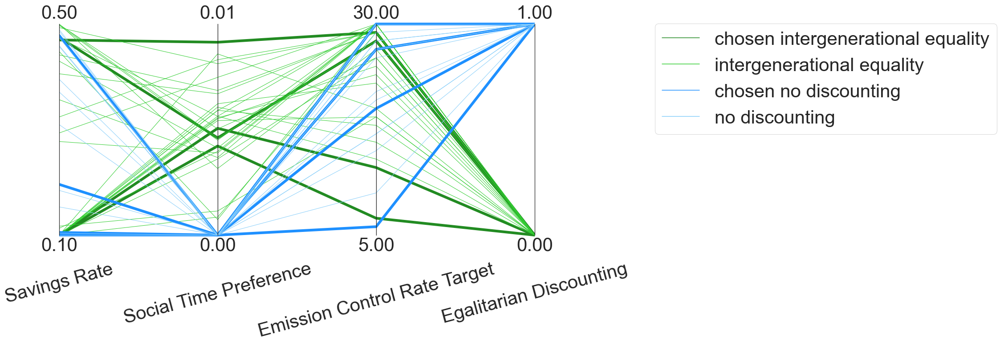

In [148]:
pollimits = pd.DataFrame({"Savings Rate":[0.1,0.5], 'Social Time Preference':[0.000, 0.015], 
                          'Emission Control Rate Target':[5, 30],
                          'Egalitarian Discounting': [0,1]})

paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=15, fontsize=42)
paraxes.fig.set_size_inches(20,11)

index1 = [0,0,1,1]
index2 = [1,0,1,0]

for policy in range(0,4):
    data_to_plot = data[(data['principle'] == index1[policy]) & (data['highlight'] ==index2[policy]) ]
    if (index1[policy] == 0 and index2[policy]==0):
        color = "limegreen"
        size = 1
    if (index1[policy] == 0 and index2[policy]==1):
        color = "forestgreen"
        size = 6
        
    if (index1[policy] == 1 and index2[policy]==0):
        color = "lightskyblue"
        size = 1
    if (index1[policy] == 1 and index2[policy]==1):
        color = "dodgerblue"
        size = 6
    paraxes.plot(data_to_plot,color = color,linewidth=size, label = labels[policy])

paraxes.legend()
# cf.change_fontsize(paraxes, fs=24)
paraxes.fig.savefig("chosen_policies_egalitarian.png", bbox_inches='tight')
plt.show()

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)
C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


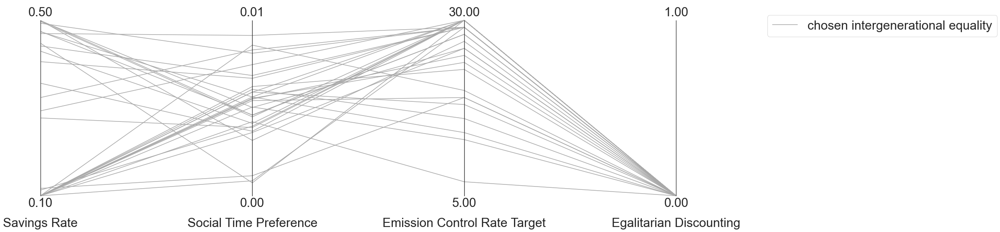

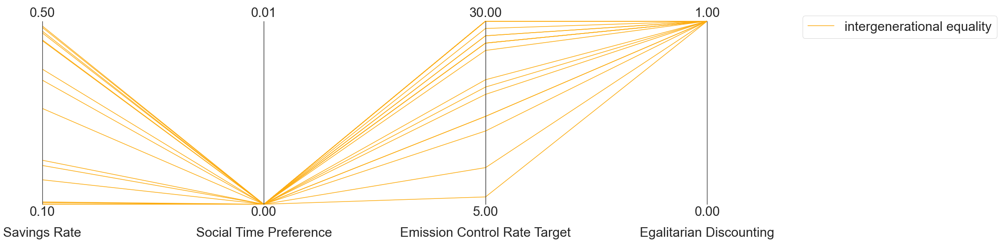

In [149]:
for i in range(0,2):
    paraxes = parcoords.ParallelAxes(parcoords.get_limits(pollimits), rot=0, fontsize=30)
    paraxes.fig.set_size_inches(25,8)
    data_to_plot = data[data['Egalitarian Discounting']==i]
    paraxes.plot(data_to_plot,color = clr_palette[i], label = labels[i])
    paraxes.legend()
    plt.show

#### graph 1 
+ savings rate either high or low  so two low and two high savings rate pick
+ irstp mid range dominant so two midrange and one high and one low
+ emission control rate: predominantly high so two high one middle one low
+ discounting equal for all

policies that sufficy this criteria set are: 
- policy 36
- policy 0
- policy 39
- policy 18

#### graph 2
+ savings rate more equally spread, one high one low and two middle
+ irstp same for all
+ miu equally spread so one high one low and to middle (equal interval)
+ discounting equal for all

policies that sufficy this criteria set are: 

- policy 14
- policy 42
- policy 48
- policy 29

## Summmary of policies

In [150]:
policy_list_util= [("370","util0"),("132","util0"),
                   ("79","util1"),("417","util1"),("857","util1")]

policy_list_ega = [("36","ega0"),("0","ega0"),("39","ega0"),("18","ega0"),
                   ("14","ega1"),("42","ega1"),("48","ega1"),("29","ega1")]

policy_list_prio= [("11","prio0"),("28","prio0"),("33","prio0"),("26","prio0"),
                   ("49","prio1"),("19","prio1"),("1","prio1"),("15","prio1")]

policy_list_suf = [("0","suf0"),("29","suf0"),("30","suf0"),("10","suf0"),
                   ("6","suf1"),("35","suf1"),("13","suf1"),("11","suf1")]

lists_policies = [policy_list_util,policy_list_ega,policy_list_prio,policy_list_suf]

policy_util = pd.DataFrame(columns = results_util.columns)

policy_util = pd.DataFrame(columns = results_util.columns)
policy_suf = pd.DataFrame(columns = results_suf.columns)
policy_ega = pd.DataFrame(columns = results_ega.columns)
policy_prio = pd.DataFrame(columns = results_prio.columns)

for policy_combi in policy_list_util:
        policy = policy_combi[0]
        policy_util.loc["policy"+policy] = results_util.loc[int(policy)]

for policy_combi in policy_list_suf:
        policy = policy_combi[0]
        policy_suf.loc["policy"+policy] = results_suf.loc[int(policy)]

for policy_combi in policy_list_ega:
        policy = policy_combi[0]
        policy_ega.loc["policy"+policy] = results_ega.loc[int(policy)]

for policy_combi in policy_list_prio:
        policy = policy_combi[0]
        policy_prio.loc["policy"+policy] = results_prio.loc[int(policy)]

policy_util = policy_util.iloc[:,1:4]
policy_prio = policy_prio.iloc[:,1:6]
policy_ega  = policy_ega.iloc[:,1:5]
policy_suf  = policy_suf.iloc[:,2:8]

policy_util['principle'] = "utilitarian"       
policy_prio['principle'] = "prioritarian"        
policy_ega['principle'] = "egalitarian"        
policy_suf['principle'] = "sufficitarian"        

frames = [policy_util,policy_suf,policy_ega,policy_prio]

policy_total = pd.concat(frames,axis=0)

policy_total.columns

policy_total = policy_total[['sr','irstp','miu_period','egalitarian_discounting', 'growth_factor_prio',
       'prioritarian_discounting',
       'sufficitarian growth factor', 'sufficitarian_discounting',
       'treshold level','principle']]

In [151]:
policy_total = policy_total[["sr","irstp","miu_period","principle"]]
policy_total

,sr,irstp,miu_period,principle
policy370,0.201485,0.001000,13,utilitarian
policy132,0.209476,0.004900,13,utilitarian
policy79,0.211594,0.006200,12,utilitarian
policy417,0.202906,0.013500,14,utilitarian
policy857,0.215375,0.007500,13,utilitarian
policy0,0.269474,0.001000,7,sufficitarian
policy29,0.268216,0.001000,7,sufficitarian
policy30,0.264094,0.001000,7,sufficitarian
policy10,0.266118,0.001000,7,sufficitarian
policy6,0.272596,0.001000,7,sufficitarian


In [63]:
policy_total.T.to_excel('example_policys_principles_word_table.xlsx')

In [61]:
policy_total.to_csv('example_policys_principles.csv')

In [39]:
policy_prio_controls = policy_prio.iloc[:,1:6]

policy_list_prio = []

for i in range (0,len(policy_prio_controls)):
    policy_dict = policy_prio_controls.iloc[i].to_dict()
    policy_list_prio.append(Policy(policy_prio_controls.index[i], **policy_dict)) 

In [42]:
policy_dict

{'irstp': 0.014605190150383241,
 'miu_period': 5,
 'growth_factor_prio': 1.025143728033696,
 'prioritarian_discounting': 1,
 'principle': 'prioritarian'}

In [182]:
policy_suf_controls = policy_suf.iloc[:,2:8]

policy_list_suf= []

for i in range (0,len(policy_suf_controls)):
    policy_dict = policy_suf_controls.iloc[i].to_dict()
    policy_list_suf.append(Policy(policy_suf_controls.index[i], **policy_dict)) 

In [183]:
policy_ega_controls = policy_ega.iloc[:,1:5]

policy_list_ega = []

for i in range (0,len(policy_ega_controls)):
    policy_dict = policy_ega_controls.iloc[i].to_dict()
    policy_list_ega.append(Policy(policy_ega_controls.index[i], **policy_dict)) 

In [184]:
policy_util_controls = policy_util.iloc[:,1:4]

policy_list_util = []

for i in range (0,len(policy_util_controls)):
    policy_dict = policy_util_controls.iloc[i].to_dict()
    policy_list_util.append(Policy(policy_util_controls.index[i], **policy_dict)) 

In [ ]:
results_prio_test_set = pd.read_excel("results_MOEA_prio_25000_eps0,01.xlsx")
results_prio_test_set = results_prio_test_set.iloc[0:10,1:5]
results_prio_test_set = results_prio_test_set.drop(['periodfullpart'],axis = 1)

policy_list = []

for i in range (0,10):
    policy_dict = results_prio_test_set.iloc[i].to_dict()
    policy_list.append(Policy("Policy " + str(i), **policy_dict)) 
    

In [487]:
policy_dict = {}
policy_dict["util"] =policy_list_util
policy_dict["prio"]=policy_list_prio
policy_dict["ega"]=policy_list_ega
policy_dict["suf"]=policy_list_suf

## 2 plotting over objectives

### 2.1 prioritarian case

In [185]:
output_worst_off_income_class = pd.DataFrame(index =region_pop_gr.columns )
output_worst_off_climate_impact = pd.DataFrame(index =region_pop_gr.columns)
output_population_under_treshold =  pd.DataFrame(index =region_pop_gr.columns)
output_max_utility_distance_treshold = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_utility_gini = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_impact_gini = pd.DataFrame(index =region_pop_gr.columns)
output_climate_impact_per_dollar_gini = pd.DataFrame(index =region_pop_gr.columns)
output_utility_intra_gini = pd.DataFrame(index =region_pop_gr.columns)
output_regional_miu = pd.DataFrame(index =region_pop_gr.columns)
output_label =pd.DataFrame(index =region_pop_gr.columns)

output_Y = pd.DataFrame(index =region_pop_gr.columns)
output_E = pd.DataFrame(index =region_pop_gr.columns)
output_U = pd.DataFrame(index =region_pop_gr.columns)
output_D = pd.DataFrame(index =region_pop_gr.columns)
output_T = pd.DataFrame(index =region_pop_gr.columns)

control_sr  = pd.DataFrame(index =region_pop_gr.columns)
control_miu_period  = pd.DataFrame(index =region_pop_gr.columns)
control_irstp  = pd.DataFrame(index =region_pop_gr.columns)

In [186]:
results = results_prio.iloc[:,1:]
results.head()

,sr,irstp,miu_period,growth_factor_prio,prioritarian_discounting,Lowest income per capita 2055,Highest climate impact per capita 2055,Lowest income per capita 2105,Highest climate impact per capita 2105,Lowest income per capita 2155,Highest climate impact per capita 2155,Lowest income per capita 2205,Highest climate impact per capita 2205,Lowest income per capita 2305,Highest climate impact per capita 2305
0,0.155207,0.011211,8,1.030409,0,2.321420,0.021890,6.743942,0.038718,13.004507,0.054182,20.999177,0.069982,38.971497,0.102568
1,0.250948,0.002806,5,1.032817,1,2.270247,0.021711,6.889788,0.038407,14.172483,0.056063,23.019511,0.073137,42.725476,0.108159
2,0.272641,0.014410,5,1.019880,1,2.260569,0.022012,6.875031,0.039555,14.243970,0.058225,23.154179,0.076013,42.971206,0.112463
3,0.227084,0.002805,5,1.017951,1,2.280045,0.021389,6.891047,0.037198,14.030960,0.053788,22.765635,0.070105,42.259030,0.103616
4,0.237704,0.002410,7,1.008511,1,2.290089,0.022687,6.859831,0.041528,14.022948,0.060153,22.766475,0.078179,42.237308,0.115102


In [187]:
for i in range(0,len(results.index)):
    model(sr = results.iloc[i,0],miu_period=results.iloc[i,2],irstp = results.iloc[i,1],
          growth_factor_prio =  results.iloc[i,3],  prioritarian_discounting = results.iloc[i,4])
    
    run_name = "policy" + str(i)
    
    #standard output
    output_label[run_name] = results.iloc[i,4]
    output_Y[run_name]  = model.global_ouput
    output_E[run_name] = model.E_worldwilde_per_year
    output_U[run_name] = model.global_per_util_ww
    output_D[run_name] = model.global_damages
    output_T[run_name] = model.temp_atm
    
    #alternative objectives
    output_worst_off_income_class[run_name] = model.worst_off_income_class
    output_worst_off_climate_impact[run_name] = model.worst_off_climate_impact
    output_population_under_treshold[run_name] =  model.population_under_treshold
    output_max_utility_distance_treshold[run_name] = model.max_utility_distance_treshold
    output_intertemporal_utility_gini[run_name] = model.intertemporal_utility_gini
    output_intertemporal_impact_gini[run_name] = model.intertemporal_impact_gini 
    output_climate_impact_per_dollar_gini[run_name] = model.climate_impact_per_dollar_gini
    output_utility_intra_gini[run_name] = model.CPC_intra_gini
    for region in range(0,12):
        run_name_region = "policy" + str(i) + "_region_"+ str(region)
        output_regional_miu[run_name_region]  = model.miu[region]

outcomes_dict = {}

outcomes_dict["MIU"] = output_regional_miu

outcomes_dict["principle"] = output_label
outcomes_dict["Worst of income class"] = output_worst_off_income_class
outcomes_dict["Worst of climate impact"] = output_worst_off_climate_impact
outcomes_dict["Population under sufficitarian treshold"] = output_population_under_treshold
outcomes_dict["Maximum distance to treshold"] = output_max_utility_distance_treshold
outcomes_dict["Gini of intertemporal consumption"] = output_intertemporal_utility_gini
outcomes_dict["Gini of intertemporal climate impact"] = output_intertemporal_impact_gini
outcomes_dict["Gini of intratemporal impact relative to consumption"] = output_climate_impact_per_dollar_gini
outcomes_dict["Gini of intratemporal consumption"] = output_utility_intra_gini
outcomes_dict["World aggregated yearly output"] = output_Y
outcomes_dict["World aggregated yearly emissions"] = output_E
outcomes_dict["World aggregated yearly period utility"] = output_U
outcomes_dict["World aggregated yearly damages"] = output_D
outcomes_dict["Global atmospheric temperature increase"] = output_T

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.011211205554863105
[0.89450189 0.89450189 0.89450189 0.89450189 0.89450189 0.89450189
 0.89450189 0.89450189 0.89450189 0.89450189 0.89450189 0.89450189]
0.8945018946565377
period utility with WW at t = 1
[ 144.03753824  209.0590813    50.21119668   56.79725868   54.2249539
  664.59872125 -336.28763765  138.71378438 -353.94651884  178.3159655
   62.20540836 -174.74074467]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0028064919060710545
[0.97236346 0.97236346 0.97236346 0.97236346 0.97236346 0.97236346
 0.97236346 0.97236346 0.97236346 0.97236346 0.97236346 0.97236346]
0.9723634636654317
period utility with WW at t = 1
[ 156.57522965  227.2565476    54.58181074   61.74115394   58.94494389
  722.44845808 -365.55966409  150.78807171 -384.75565571  193.83740926
   67.6200539  -189.95098473]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.014409671916605337
[0.86669479 0.86669479 0.86669479 0.86669479 0.86669479 0.86669479
 0.86669479 0.86669479 0.86669479 0.86669479 0.86669479 0.86669479]
0.866694791241466
period utility with WW at t = 1
[ 139.55988789  202.56012638   48.65029676   55.03161989   52.53927955
  643.9385466  -325.83356799  134.40163192 -342.94349301  172.7727123
   60.27164809 -169.30863325]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0028050152816221988
[0.97237778 0.97237778 0.97237778 0.97237778 0.97237778 0.97237778
 0.97237778 0.97237778 0.97237778 0.97237778 0.97237778 0.97237778]
0.9723777817547502
period utility with WW at t = 1
[ 156.57753523  227.25989397   54.58261446   61.74206308   58.94581186
  722.45909616 -365.56504697  150.79029207 -384.76132125  193.84026353
   67.62104961 -189.95378177]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0024102878590677593
[0.97621359 0.97621359 0.97621359 0.97621359 0.97621359 0.97621359
 0.97621359 0.97621359 0.97621359 0.97621359 0.97621359 0.97621359]
0.9762135866365763
period utility with WW at t = 1
[ 157.1951973   228.15638155   54.79793021   61.9856212    59.17833942
  725.30902977 -367.00711631  151.38512481 -386.27911544  194.60491842
   67.88779897 -190.70310539]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.012455581625947777
[0.88356847 0.88356847 0.88356847 0.88356847 0.88356847 0.88356847
 0.88356847 0.88356847 0.88356847 0.88356847 0.88356847 0.88356847]
0.8835684711206364
period utility with WW at t = 1
[ 142.27697918  206.50376924   49.59746933   56.10303043   53.56216672
  656.47538541 -332.17722135  137.01829713 -349.62025947  176.13642403
   61.44507674 -172.60490283]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006734418091209215
[0.93508445 0.93508445 0.93508445 0.93508445 0.93508445 0.93508445
 0.93508445 0.93508445 0.93508445 0.93508445 0.93508445 0.93508445]
0.93508445091731
period utility with WW at t = 1
[ 150.57236118  218.54385934   52.48922284   59.37408715   56.68507976
  694.75082619 -351.54463382  145.00707452 -370.0046788   186.40596257
   65.02759856 -182.66853794]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0031504977953068026
[0.96903412 0.96903412 0.96903412 0.96903412 0.96903412 0.96903412
 0.96903412 0.96903412 0.96903412 0.96903412 0.96903412 0.96903412]
0.9690341223176625
period utility with WW at t = 1
[ 156.03912108  226.47842847   54.39492437   61.5297542    58.74311829
  719.9748177  -364.30799951  150.27177818 -383.43826467  193.17371618
   67.388525   -189.30059864]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0027838196529077377
[0.97258333 0.97258333 0.97258333 0.97258333 0.97258333 0.97258333
 0.97258333 0.97258333 0.97258333 0.97258333 0.97258333 0.97258333]
0.9725833307323581
period utility with WW at t = 1
[ 156.61063384  227.30793398   54.59415256   61.75511461   58.9582723
  722.61181533 -365.64232302  150.82216732 -384.84265517  193.88123903
   67.63534389 -189.99393571]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008508414056531393
[0.91876563 0.91876563 0.91876563 0.91876563 0.91876563 0.91876563
 0.91876563 0.91876563 0.91876563 0.91876563 0.91876563 0.91876563]
0.9187656310870974
period utility with WW at t = 1
[ 147.94461645  214.72989595   51.5731963    58.33790798   55.69582836
  682.62623835 -345.40957988  142.47645355 -363.54746557  183.15286033
   63.89275597 -179.48066015]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.011645090261884015
[0.89067286 0.89067286 0.89067286 0.89067286 0.89067286 0.89067286
 0.89067286 0.89067286 0.89067286 0.89067286 0.89067286 0.89067286]
0.8906728591945875
period utility with WW at t = 1
[ 143.42096622  208.16417584   49.99626091   56.55413039   53.99283671
  661.75381719 -334.84811327  138.1200014  -352.43140324  177.55266007
   61.93912976 -173.99274345]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.007439303105224694
[0.92856241 0.92856241 0.92856241 0.92856241 0.92856241 0.92856241
 0.92856241 0.92856241 0.92856241 0.92856241 0.92856241 0.92856241]
0.9285624144924982
period utility with WW at t = 1
[ 149.52214756  217.01955744   52.12312048   58.95996417   56.2897121
  689.90507114 -349.09267677  143.99567772 -367.42396645  185.10581638
   64.57404342 -181.39445959]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.007867990068287615
[0.92462041 0.92462041 0.92462041 0.92462041 0.92462041 0.92462041
 0.92462041 0.92462041 0.92462041 0.92462041 0.92462041 0.92462041]
0.9246204145036052
period utility with WW at t = 1
[ 148.88738538  216.09825039   51.90184366   58.70966308   56.05074696
  686.97623648 -347.61068342  143.38437691 -365.86415179  184.31999185
   64.29990904 -180.62439077]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.005691472507273547
[0.94482706 0.94482706 0.94482706 0.94482706 0.94482706 0.94482706
 0.94482706 0.94482706 0.94482706 0.94482706 0.94482706 0.94482706]
0.9448270607733175
period utility with WW at t = 1
[ 152.14116897  220.82085963   53.03610608   59.99270354   57.27567948
  701.98940901 -355.20736418  146.5178978  -373.85974369  188.3481193
   65.70511868 -184.5717546 ]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0011344911868158454
[0.98872556 0.98872556 0.98872556 0.98872556 0.98872556 0.98872556
 0.98872556 0.98872556 0.98872556 0.98872556 0.98872556 0.98872556]
0.9887255569390669
period utility with WW at t = 1
[ 159.2099425   231.08062468   55.50026635   62.7800808    59.93681854
  734.6051973  -371.71098666  153.32540326 -391.22999186  197.09913792
   68.75790582 -193.14731598]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.014605190150383241
[0.86502609 0.86502609 0.86502609 0.86502609 0.86502609 0.86502609
 0.86502609 0.86502609 0.86502609 0.86502609 0.86502609 0.86502609]
0.8650260853597574
period utility with WW at t = 1
[ 139.29118383  202.17012372   48.55662706   54.9256638    52.43812213
  642.69872832 -325.20621867  134.1428594  -342.28320079  172.44006135
   60.15560303 -168.98265193]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.014604658878146487
[0.86503061 0.86503061 0.86503061 0.86503061 0.86503061 0.86503061
 0.86503061 0.86503061 0.86503061 0.86503061 0.86503061 0.86503061]
0.8650306148621798
period utility with WW at t = 1
[ 139.2919132   202.17118233   48.55688132   54.92595141   52.43839671
  642.70209366 -325.20792153  134.1435618  -342.28499307  172.44096429
   60.15591802 -168.98353677]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.014344863172755675
[0.8672487 0.8672487 0.8672487 0.8672487 0.8672487 0.8672487 0.8672487
 0.8672487 0.8672487 0.8672487 0.8672487 0.8672487]
0.8672487010117776
period utility with WW at t = 1
[ 139.64908144  202.68958375   48.68138945   55.06679092   52.57285771
  644.35009153 -326.04181015  134.48752879 -343.16267022  172.88313236
   60.31016806 -169.4168394 ]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0038772123675183726
[0.96204202 0.96204202 0.96204202 0.96204202 0.96204202 0.96204202
 0.96204202 0.96204202 0.96204202 0.96204202 0.96204202 0.96204202]
0.9620420160741163
period utility with WW at t = 1
[ 154.91321428  224.84426389   54.00243551   61.08578369   58.31925487
  714.77980929 -361.6793199   149.18748588 -380.67154983  191.77986315
   66.90228028 -187.93469226]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.004155506361068637
[0.95937911 0.95937911 0.95937911 0.95937911 0.95937911 0.95937911
 0.95937911 0.95937911 0.95937911 0.95937911 0.95937911 0.95937911]
0.9593791131471446
period utility with WW at t = 1
[ 154.48441923  224.22190184   53.85295842   60.91670011   58.15782895
  712.8013206  -360.67820258  148.77453948 -379.6178626   191.24902235
   66.71709681 -187.41449477]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.012790333179115057
[0.8806524 0.8806524 0.8806524 0.8806524 0.8806524 0.8806524 0.8806524
 0.8806524 0.8806524 0.8806524 0.8806524 0.8806524]
0.8806524047725038
period utility with WW at t = 1
[ 141.80741839  205.82223893   49.43378138   55.91787199   53.38539397
  654.30880088 -331.08092734  136.56609172 -348.46639771  175.55511594
   61.24228779 -172.03524993]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.013858010642976114
[0.87142222 0.87142222 0.87142222 0.87142222 0.87142222 0.87142222
 0.87142222 0.87142222 0.87142222 0.87142222 0.87142222 0.87142222]
0.871422222007735
period utility with WW at t = 1
[ 140.32112439  203.66500088   48.91566227   55.33179265   52.82585772
  647.45094211 -327.61084374  135.13473244 -344.81409571  173.71510983
   60.60040286 -170.23213579]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0016334568671125778
[0.98381123 0.98381123 0.98381123 0.98381123 0.98381123 0.98381123
 0.98381123 0.98381123 0.98381123 0.98381123 0.98381123 0.98381123]
0.9838112275304214
period utility with WW at t = 1
[ 158.41861057  229.93206904   55.22440962   62.46804072   59.63891053
  730.95393947 -369.86344644  152.56331965 -389.28543501  196.11948276
   68.41615375 -192.18730284]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008638872035125394
[0.91757799 0.91757799 0.91757799 0.91757799 0.91757799 0.91757799
 0.91757799 0.91757799 0.91757799 0.91757799 0.91757799 0.91757799]
0.9175779853222856
period utility with WW at t = 1
[ 147.7533753   214.45232456   51.50653002   58.26249726   55.62383294
  681.74383904 -344.96308492  142.29228084 -363.0775246   182.91610711
   63.81016476 -179.24865381]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0075951043832136
[0.92712761 0.92712761 0.92712761 0.92712761 0.92712761 0.92712761
 0.92712761 0.92712761 0.92712761 0.92712761 0.92712761 0.92712761]
0.9271276061405754
period utility with WW at t = 1
[ 149.29110695  216.68422029   52.04258019   58.86885963   56.20273361
  688.8390345  -348.55326113  143.77317658 -366.85622543  184.81979213
   64.47426404 -181.1141701 ]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0011241609204001633
[0.98882758 0.98882758 0.98882758 0.98882758 0.98882758 0.98882758
 0.98882758 0.98882758 0.98882758 0.98882758 0.98882758 0.98882758]
0.9888275849700983
period utility with WW at t = 1
[ 159.22637161  231.10447023   55.5059935    62.78655917   59.94300351
  734.68100228 -371.74934406  153.34122513 -391.27036345  197.11947686
   68.76500104 -193.16724714]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.005641999368745549
[0.94529198 0.94529198 0.94529198 0.94529198 0.94529198 0.94529198
 0.94529198 0.94529198 0.94529198 0.94529198 0.94529198 0.94529198]
0.9452919768124607
period utility with WW at t = 1
[ 152.21603226  220.92951777   53.06220328   60.02222383   57.30386282
  702.33483322 -355.38214919  146.58999408 -374.04370687  188.44079876
   65.73744985 -184.66257584]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.003232397300707539
[0.96824334 0.96824334 0.96824334 0.96824334 0.96824334 0.96824334
 0.96824334 0.96824334 0.96824334 0.96824334 0.96824334 0.96824334]
0.9682433357868034
period utility with WW at t = 1
[ 155.91178435  226.29360929   54.35053504   61.47954245   58.69518059
  719.38727762 -364.01070362  150.14914793 -383.1253574   193.01607553
   67.33353216 -189.14611867]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0057527648829090615
[0.94425142 0.94425142 0.94425142 0.94425142 0.94425142 0.94425142
 0.94425142 0.94425142 0.94425142 0.94425142 0.94425142 0.94425142]
0.9442514241118577
period utility with WW at t = 1
[ 152.04847683  220.68632434   53.00379379   59.95615293   57.24078423
  701.56172139 -354.9909538   146.42863165 -373.63196933  188.23336806
   65.66508778 -184.4593041 ]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.00895051917379382
[0.91474768 0.91474768 0.91474768 0.91474768 0.91474768 0.91474768
 0.91474768 0.91474768 0.91474768 0.91474768 0.91474768 0.91474768]
0.9147476839497113
period utility with WW at t = 1
[ 147.29762485  213.79083887   51.34765633   58.08278455   55.45225928
  679.64097634 -343.89903422  141.85337532 -361.95759929  182.35189599
   63.61334008 -178.69575507]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.003833121849992807
[0.96246465 0.96246465 0.96246465 0.96246465 0.96246465 0.96246465
 0.96246465 0.96246465 0.96246465 0.96246465 0.96246465 0.96246465]
0.9624646492202321
period utility with WW at t = 1
[ 154.98126895  224.94303987   54.02615924   61.11261919   58.344875
  715.09381807 -361.83820866  149.2530252  -380.83878204  191.86411366
   66.93167102 -188.01725355]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.003872134101743463
[0.96209068 0.96209068 0.96209068 0.96209068 0.96209068 0.96209068
 0.96209068 0.96209068 0.96209068 0.96209068 0.96209068 0.96209068]
0.962090683788796
period utility with WW at t = 1
[ 154.92105102  224.8556383    54.00516738   61.08887389   58.32220512
  714.81596852 -361.69761651  149.19503297 -380.69080721  191.7895649
   66.90566473 -187.94419948]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0035562797888038593
[0.96512301 0.96512301 0.96512301 0.96512301 0.96512301 0.96512301
 0.96512301 0.96512301 0.96512301 0.96512301 0.96512301 0.96512301]
0.9651230123957742
period utility with WW at t = 1
[ 155.40933299  225.56434091   54.1753815    61.28141452   58.50602572
  717.0689338  -362.83761926  149.66526761 -381.89067293  192.39404948
   67.11653878 -188.5365642 ]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001115525522722715
[0.98891288 0.98891288 0.98891288 0.98891288 0.98891288 0.98891288
 0.98891288 0.98891288 0.98891288 0.98891288 0.98891288 0.98891288]
0.9889128823275692
period utility with WW at t = 1
[ 159.24010665  231.12440555   55.51078151   62.7919752    59.94817426
  734.74437667 -371.78141156  153.35445251 -391.30411486  197.13648061
   68.77093279 -193.18390996]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.013144028873235722
[0.87758281 0.87758281 0.87758281 0.87758281 0.87758281 0.87758281
 0.87758281 0.87758281 0.87758281 0.87758281 0.87758281 0.87758281]
0.8775828107563809
period utility with WW at t = 1
[ 141.31313574  205.10482681   49.26147544   55.72296516   53.19931432
  652.02814807 -329.92691467  136.09007819 -347.2517864   174.94320263
   61.02882223 -171.43560542]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.002228435517175066
[0.97798635 0.97798635 0.97798635 0.97798635 0.97798635 0.97798635
 0.97798635 0.97798635 0.97798635 0.97798635 0.97798635 0.97798635]
0.9779863536444843
period utility with WW at t = 1
[ 157.48065784  228.57070493   54.89744119   62.09818475   59.28580505
  726.62616358 -367.67358738  151.66003448 -386.98058373  194.9583136
   68.01108065 -191.04941503]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.002075889969500129
[0.97947616 0.97947616 0.97947616 0.97947616 0.97947616 0.97947616
 0.97947616 0.97947616 0.97947616 0.97947616 0.97947616 0.97947616]
0.9794761580121022
period utility with WW at t = 1
[ 157.72055421  228.9188955    54.98106858   62.19278131   59.3761174
  727.73306127 -368.23367875  151.89106406 -387.57008619  195.25530113
   68.11468455 -191.34044798]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0014390044904383345
[0.98572319 0.98572319 0.98572319 0.98572319 0.98572319 0.98572319
 0.98572319 0.98572319 0.98572319 0.98572319 0.98572319 0.98572319]
0.9857231929599847
period utility with WW at t = 1
[ 158.7264856   230.37892527   55.33173424   62.58944281   59.7548144
  732.37449519 -370.58224909  152.85981535 -390.04198288  196.50062668
   68.54911556 -192.56080485]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008806787511764934
[0.91605182 0.91605182 0.91605182 0.91605182 0.91605182 0.91605182
 0.91605182 0.91605182 0.91605182 0.91605182 0.91605182 0.91605182]
0.9160518240025535
period utility with WW at t = 1
[ 147.50762454  214.0956368    51.4208618    58.16559218   55.53131662
  680.6099288  -344.38932517  142.05561324 -362.47363602  182.61187195
   63.70403253 -178.95051854]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.004334158121124321
[0.95767393 0.95767393 0.95767393 0.95767393 0.95767393 0.95767393
 0.95767393 0.95767393 0.95767393 0.95767393 0.95767393 0.95767393]
0.9576739273230033
period utility with WW at t = 1
[ 154.20984098  223.82337324   53.75724099   60.80842769   58.05446011
  711.53439839 -360.03713864  148.51010987 -378.94313559  190.90909925
   66.59851486 -187.0813871 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001893162028917866
[0.98126402 0.98126402 0.98126402 0.98126402 0.98126402 0.98126402
 0.98126402 0.98126402 0.98126402 0.98126402 0.98126402 0.98126402]
0.9812640195362126
period utility with WW at t = 1
[ 158.00844535  229.3367467    55.08142685   62.3063033    59.48449807
  729.06141003 -368.90582459  152.1683145  -388.27752725  195.61170535
   68.23901594 -191.68970632]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001312101781673752
[0.98697318 0.98697318 0.98697318 0.98697318 0.98697318 0.98697318
 0.98697318 0.98697318 0.98697318 0.98697318 0.98697318 0.98697318]
0.9869731759400496
period utility with WW at t = 1
[ 158.92776463  230.67106584   55.40189971   62.66881168   59.83058872
  733.30320993 -371.05217971  153.05365492 -390.53659014  196.74980662
   68.63604182 -192.80498875]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006225163055005271
[0.93982775 0.93982775 0.93982775 0.93982775 0.93982775 0.93982775
 0.93982775 0.93982775 0.93982775 0.93982775 0.93982775 0.93982775]
0.9398277476623812
period utility with WW at t = 1
[ 151.3361525   219.65244197   52.75547896   59.67526734   56.97261973
  698.27500984 -353.32787437  145.74263545 -371.88155953  187.35152293
   65.35745668 -183.5951399 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.01015668751516847
[0.90388372 0.90388372 0.90388372 0.90388372 0.90388372 0.90388372
 0.90388372 0.90388372 0.90388372 0.90388372 0.90388372 0.90388372]
0.9038837249149231
period utility with WW at t = 1
[ 145.54825134  211.25176175   50.73782823   57.39296702   54.79368306
  671.56925136 -339.81473307  140.1686602  -357.65882641  180.18620203
   62.85783916 -176.57348311]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0038737717263895655
[0.96207499 0.96207499 0.96207499 0.96207499 0.96207499 0.96207499
 0.96207499 0.96207499 0.96207499 0.96207499 0.96207499 0.96207499]
0.9620749892672922
period utility with WW at t = 1
[ 154.9185238   224.85197024   54.0042864    61.08787735   58.32125371
  714.80430777 -361.69171616  149.19259916 -380.68459703  191.78643625
   66.9045733  -187.94113356]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0019452877360141211
[0.98075364 0.98075364 0.98075364 0.98075364 0.98075364 0.98075364
 0.98075364 0.98075364 0.98075364 0.98075364 0.98075364 0.98075364]
0.9807536412887322
period utility with WW at t = 1
[ 157.92626148  229.21746332   55.05277772   62.27389634   59.4535588
  728.68220823 -368.71394808  152.08916821 -388.07557507  195.50996315
   68.20352324 -191.59000405]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010312026191582142
[0.98974622 0.98974622 0.98974622 0.98974622 0.98974622 0.98974622
 0.98974622 0.98974622 0.98974622 0.98974622 0.98974622 0.98974622]
0.9897462192079006
period utility with WW at t = 1
[ 159.37429507  231.31916941   55.55755932   62.84488873   59.99869137
  735.36353089 -372.09470424  153.48368121 -391.63385893  197.30260353
   68.82888466 -193.34670213]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001079245772479789
[0.98927133 0.98927133 0.98927133 0.98927133 0.98927133 0.98927133
 0.98927133 0.98927133 0.98927133 0.98927133 0.98927133 0.98927133]
0.9892713291149491
period utility with WW at t = 1
[ 159.29782569  231.20818017   55.53090225   62.81473513   59.9699034
  735.01069615 -371.91616949  153.41003821 -391.4459491   197.20793578
   68.79585988 -193.25393246]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0012019478315184351
[0.9880596 0.9880596 0.9880596 0.9880596 0.9880596 0.9880596 0.9880596
 0.9880596 0.9880596 0.9880596 0.9880596 0.9880596]
0.9880595984802902
period utility with WW at t = 1
[ 159.10270626  230.92497977   55.46288401   62.73779512   59.89644796
  734.11040221 -371.46061983  153.22213057 -390.96647796  196.96638132
   68.71159376 -193.01722115]
#########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006977673488423782
[0.93282802 0.93282802 0.93282802 0.93282802 0.93282802 0.93282802
 0.93282802 0.93282802 0.93282802 0.93282802 0.93282802 0.93282802]
0.9328280232286033
period utility with WW at t = 1
[ 150.20901897  218.01649691   52.36256247   59.2308131    56.54829449
  693.07434125 -350.69633071  144.65716177 -369.11183025  185.95615124
   64.87068218 -182.2277453 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006609568492324587
[0.93624488 0.93624488 0.93624488 0.93624488 0.93624488 0.93624488
 0.93624488 0.93624488 0.93624488 0.93624488 0.93624488 0.93624488]
0.9362448819638698
period utility with WW at t = 1
[ 150.75922007  218.81507023   52.55436147   59.44776983   56.75542541
  695.61300546 -351.98089741  145.18702694 -370.46385114  186.63729062
   65.1082972  -182.89522789]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.013102382417111905
[0.87794363 0.87794363 0.87794363 0.87794363 0.87794363 0.87794363
 0.87794363 0.87794363 0.87794363 0.87794363 0.87794363 0.87794363]
0.8779436328833564
period utility with WW at t = 1
[ 141.37123728  205.18915658   49.28172952   55.74587591   53.22118746
  652.29623238 -330.06256561  136.14603224 -347.39456054  175.01513131
   61.0539145  -171.50609195]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008006738229760585
[0.9233485 0.9233485 0.9233485 0.9233485 0.9233485 0.9233485 0.9233485
 0.9233485 0.9233485 0.9233485 0.9233485 0.9233485]
0.923348498915233
period utility with WW at t = 1
[ 148.68257464  215.80098383   51.83044704   58.62890158   55.97364308
  686.03122622 -347.13250725  143.18713616 -365.36086599  184.06643973
   64.21145755 -180.37592235]
###########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001988747172648369
[0.98032834 0.98032834 0.98032834 0.98032834 0.98032834 0.98032834
 0.98032834 0.98032834 0.98032834 0.98032834 0.98032834 0.98032834]
0.980328340279294
period utility with WW at t = 1
[ 157.85777721  229.11806383   55.02890424   62.24689144   59.42777693
  728.36621727 -368.55405634  152.02321518 -387.90728721  195.42518082
   68.17394697 -191.50692159]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.011487926323534106
[0.89205775 0.89205775 0.89205775 0.89205775 0.89205775 0.89205775
 0.89205775 0.89205775 0.89205775 0.89205775 0.89205775 0.89205775]
0.8920577454316583
period utility with WW at t = 1
[ 143.6439681   208.48784541   50.07399892   56.64206507   54.07678889
  662.7827626  -335.36876071  138.33476093 -352.97939052  177.82873251
   62.03543745 -174.26328067]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.01274836150986077
[0.88101744 0.88101744 0.88101744 0.88101744 0.88101744 0.88101744
 0.88101744 0.88101744 0.88101744 0.88101744 0.88101744 0.88101744]
0.8810174445685744
period utility with WW at t = 1
[ 141.86619908  205.90755444   49.45427221   55.94105054   53.40752278
  654.58001884 -331.21816391  136.62269982 -348.61084074  175.62788541
   61.26767337 -172.10656037]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008856795354565877
[0.91559785 0.91559785 0.91559785 0.91559785 0.91559785 0.91559785
 0.91559785 0.91559785 0.91559785 0.91559785 0.91559785 0.91559785]
0.9155978491781881
period utility with WW at t = 1
[ 147.43452306  213.98953578   51.39537877   58.13676661   55.50379654
  680.27263372 -344.21865351  141.98521365 -362.29400218  182.52137358
   63.67246223 -178.86183466]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006495137706574425
[0.93730987 0.93730987 0.93730987 0.93730987 0.93730987 0.93730987
 0.93730987 0.93730987 0.93730987 0.93730987 0.93730987 0.93730987]
0.9373098654114166
period utility with WW at t = 1
[ 150.93070947  219.06397351   52.61414233   59.51539198   56.81998501
  696.40426889 -352.38127752  145.35217795 -370.88525571  186.84959151
   65.18235823 -183.10327217]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.01230533352112231
[0.88488075 0.88488075 0.88488075 0.88488075 0.88488075 0.88488075
 0.88488075 0.88488075 0.88488075 0.88488075 0.88488075 0.88488075]
0.8848807549286856
period utility with WW at t = 1
[ 142.48829023  206.81047049   49.67113193   56.18635515   53.64171773
  657.45038853 -332.67057393  137.22179793 -350.13951861  176.39802343
   61.53633552 -172.86125718]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.010498942945878869
[0.90082694 0.90082694 0.90082694 0.90082694 0.90082694 0.90082694
 0.90082694 0.90082694 0.90082694 0.90082694 0.90082694 0.90082694]
0.9008269376472738
period utility with WW at t = 1
[ 145.05603091  210.53734276   50.56624118   57.19887337   54.60837977
  669.29811374 -338.66553509  139.69463266 -356.44928262  179.5768417
   62.6452642  -175.9763404 ]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0027114243347276423
[0.97328576 0.97328576 0.97328576 0.97328576 0.97328576 0.97328576
 0.97328576 0.97328576 0.97328576 0.97328576 0.97328576 0.97328576]
0.9732857597523562
period utility with WW at t = 1
[ 156.72374276  227.47210262   54.63358211   61.79971602   59.00085374
  723.13370738 -365.90640094  150.93109564 -385.12060014  194.02126591
   67.68419217 -190.13115506]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006425557641127968
[0.93795808 0.93795808 0.93795808 0.93795808 0.93795808 0.93795808
 0.93795808 0.93795808 0.93795808 0.93795808 0.93795808 0.93795808]
0.9379580840014803
period utility with WW at t = 1
[ 151.03508914  219.21547233   52.65052887   59.55655124   56.8592802
  696.88588357 -352.62497505  145.45269965 -371.1417501   186.97881172
   65.22743662 -183.22990152]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.003906943964326049
[0.96175714 0.96175714 0.96175714 0.96175714 0.96175714 0.96175714
 0.96175714 0.96175714 0.96175714 0.96175714 0.96175714 0.96175714]
0.9617571367450499
period utility with WW at t = 1
[ 154.86734147  224.77768314   53.98644434   61.067695     58.3019854
  714.5681491  -361.57221963  149.14330857 -380.55882559  191.72307341
   66.88246922 -187.87904114]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0057448334719824795
[0.94432589 0.94432589 0.94432589 0.94432589 0.94432589 0.94432589
 0.94432589 0.94432589 0.94432589 0.94432589 0.94432589 0.94432589]
0.9443258914279535
period utility with WW at t = 1
[ 152.06046796  220.70372851   53.00797388   59.96088131   57.24529846
  701.61704926 -355.01894976  146.44017958 -373.66143539  188.24821287
   65.67026638 -184.47385128]
#############################

#### 2.1.1 Calculate average MIU over all regions

In [188]:
average_miu_timestep = pd.DataFrame(index =region_pop_gr.columns , columns = outcomes_dict["Worst of income class"].columns)

regional_miu = outcomes_dict["MIU"]

for row in range(0,31):
    i = 0
    j = 11
    for policies in range(0,len(results)):
        policy_name = "policy" + str(policies)
        mean_miu = regional_miu.iloc[row,i:j].mean()
        average_miu_timestep.iloc[row,policies] = mean_miu
        i = i + 12
        j = j + 12

        average_miu_timestep

In [218]:
k = outcomes_dict['Worst of income class']
k = k.append(pd.Series(name='principle'))
k.loc['principle'] = "prioritarian"
k = k.loc[['principle']] == "prioritarian"
k

,policy0,policy1,policy2,policy3,policy4,policy5,policy6,policy7,policy8,policy9,...,policy54,policy55,policy56,policy57,policy58,policy59,policy60,policy61,policy62,policy63
principle,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


#### 2.1.2 Performance on objectives over time

In [212]:
data_sub_plot = outcomes_dict['principle'].columns

64

In [214]:
color =clr_palette[outcomes_dict['principle'].iloc[0,63]]
color

(0.987874, 0.675267, 0.065257)

IndexError: single positional indexer is out-of-bounds

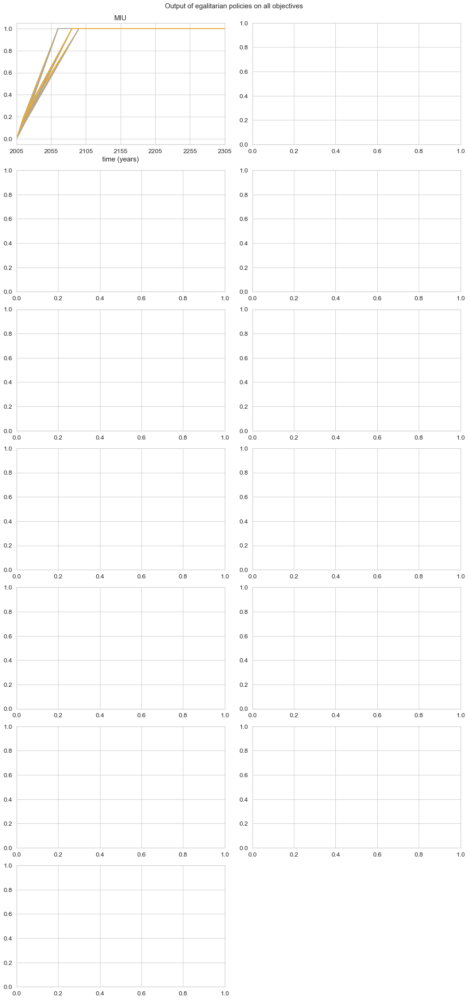

In [216]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 30),constrained_layout=True)
fig.delaxes(axes[6][1])
fig.suptitle("Output of egalitarian policies on all objectives", fontsize=15)
#fig.subplots_adjust(hspace=1, wspace=0.2)

index_1 = [0,0,1,1,2,2,3,3,4,4,5,5,6,6,7,7,8,8]
index_2 = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
position = 0

for i in list(outcomes_dict.keys()):  
    data_sub_plot = outcomes_dict[i]
        
    for policy in range(0,len(data_sub_plot.columns)):        
        if policy == 0:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],color =clr_palette[outcomes_dict['principle'].iloc[0,policy]] ); 
            axes[index_1[position],index_2[position]].set_title(i),
            axes[index_1[position],index_2[position]].set(xlabel='time (years)')
        else:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],secondary_y=False,color =clr_palette[outcomes_dict['principle'].iloc[0,policy]])
    position = position + 1
            
    

## Sufficitarian case

#### 3.1 Sufficitarian case with utilitarian above treshold

In [45]:
output_worst_off_income_class = pd.DataFrame(index =region_pop_gr.columns )
output_worst_off_climate_impact = pd.DataFrame(index =region_pop_gr.columns)
output_population_under_treshold =  pd.DataFrame(index =region_pop_gr.columns)
output_max_utility_distance_treshold = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_utility_gini = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_impact_gini = pd.DataFrame(index =region_pop_gr.columns)
output_climate_impact_per_dollar_gini = pd.DataFrame(index =region_pop_gr.columns)
output_utility_intra_gini = pd.DataFrame(index =region_pop_gr.columns)
output_regional_miu = pd.DataFrame(index =region_pop_gr.columns)

output_Y = pd.DataFrame(index =region_pop_gr.columns)
output_E = pd.DataFrame(index =region_pop_gr.columns)
output_U = pd.DataFrame(index =region_pop_gr.columns)
output_D = pd.DataFrame(index =region_pop_gr.columns)
output_T = pd.DataFrame(index =region_pop_gr.columns)

control_sr  = pd.DataFrame(index =region_pop_gr.columns)
control_miu_period  = pd.DataFrame(index =region_pop_gr.columns)
control_irstp  = pd.DataFrame(index =region_pop_gr.columns)

In [46]:
results = results_suf.iloc[:,1:]
results.head()

,Unnamed: 0.1,sr,irstp,miu_period,sufficitarian growth factor,sufficitarian_discounting,treshold level,Distance to treshold 2055,Population under treshold 2055,Distance to treshold 2105,Population under treshold 2105,Distance to treshold 2155,Population under treshold 2155,Distance to treshold 2205,Population under treshold 2205,Distance to treshold 2305,Population under treshold 2305,Total Aggregated Utility
0,0,0.269474,0.001,7,1.04,0,2.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17966.397108
1,0,0.270722,0.001,8,1.04,1,2.06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17965.956851
2,0,0.277427,0.001,7,1.04,0,1.72,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17965.815985
3,0,0.269446,0.001,8,1.04,1,1.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17965.976093
4,0,0.272685,0.001,8,1.04,1,1.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17965.933483


In [168]:
results.iloc[0,12]

0.001000040910359662

In [47]:
for i in range(0,len(results.index)):
    model(sr = results.iloc[i,1],miu_period=results.iloc[i,3],irstp = results.iloc[i,2],
          growth_factor_suf =  results.iloc[i,4],  sufficitarian_discounting = results.iloc[i,5],
          ini_suf_treshold =results.iloc[i,6] )
    
    run_name = "policy" + str(i)

    #standard output
    output_Y[run_name]  = model.global_ouput
    output_E[run_name] = model.E_worldwilde_per_year
    output_U[run_name] = model.global_per_util_ww
    output_D[run_name] = model.global_damages
    output_T[run_name] = model.temp_atm
    
    #alternative objectives
    output_worst_off_income_class[run_name] = model.worst_off_income_class
    output_worst_off_climate_impact[run_name] = model.worst_off_climate_impact
    output_population_under_treshold[run_name] =  model.population_under_treshold
    output_max_utility_distance_treshold[run_name] = model.max_utility_distance_treshold
    output_intertemporal_utility_gini[run_name] = model.intertemporal_utility_gini
    output_intertemporal_impact_gini[run_name] = model.intertemporal_impact_gini 
    output_climate_impact_per_dollar_gini[run_name] = model.climate_impact_per_dollar_gini
    output_utility_intra_gini[run_name] = model.CPC_intra_gini
    for region in range(0,12):
        run_name_region = "policy" + str(i) + "_region_"+ str(region)
        output_regional_miu[run_name_region]  = model.miu[region]

outcomes_dict = {}

outcomes_dict["MIU"] = output_regional_miu


outcomes_dict["Worst of income class"] = output_worst_off_income_class
outcomes_dict["Worst of climate impact"] = output_worst_off_climate_impact
outcomes_dict["Population under sufficitarian treshold"] = output_population_under_treshold
outcomes_dict["Maximum distance to treshold"] = output_max_utility_distance_treshold
outcomes_dict["Gini of intertemporal consumption"] = output_intertemporal_utility_gini
outcomes_dict["Gini of intertemporal climate impact"] = output_intertemporal_impact_gini
outcomes_dict["Gini of intratemporal impact relative to consumption"] = output_climate_impact_per_dollar_gini
outcomes_dict["Gini of intratemporal consumption"] = output_utility_intra_gini
outcomes_dict["World aggregated yearly output"] = output_Y
outcomes_dict["World aggregated yearly emissions"] = output_E
outcomes_dict["World aggregated yearly period utility"] = output_U
outcomes_dict["World aggregated yearly damages"] = output_D
outcomes_dict["Global atmospheric temperature increase"] = output_T

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000005743547322
[0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478
 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478]
0.9900547750322578
period utility with WW at t = 1
[ 159.4239804   231.39128373   55.57487953   62.86448078   60.01739611
  735.59278229 -372.21070568  153.53153012 -391.75595175  197.3641131
   68.85034224 -193.40697844]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000307111158718
[0.99005448 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448
 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448]
0.9900544769599375
period utility with WW at t = 1
[ 159.4239324   231.39121407   55.5748628    62.86446185   60.01737804
  735.59256083 -372.21059362  153.5314839  -391.7558338   197.36405368
   68.85032151 -193.40692021]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000043069719647
[0.99005435 0.99005435 0.99005435 0.99005435 0.99005435 0.99005435
 0.99005435 0.99005435 0.99005435 0.99005435 0.99005435 0.99005435]
0.9900543547252729
period utility with WW at t = 1
[ 159.42391272  231.3911855    55.57485593   62.86445409   60.01737063
  735.59247001 -372.21054767  153.53146495 -391.75578543  197.36402932
   68.85031301 -193.40689633]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000031129522565
[0.99005447 0.99005447 0.99005447 0.99005447 0.99005447 0.99005447
 0.99005447 0.99005447 0.99005447 0.99005447 0.99005447 0.99005447]
0.9900544728216202
period utility with WW at t = 1
[ 159.42393173  231.3912131    55.57486256   62.86446159   60.01737779
  735.59255775 -372.21059206  153.53148326 -391.75583216  197.36405286
   68.85032122 -193.4069194 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000142422389047
[0.99005464 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464
 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464]
0.9900546398479126
period utility with WW at t = 1
[ 159.42395863  231.39125214   55.57487194   62.8644722    60.01738792
  735.59268185 -372.21065486  153.53150916 -391.75589826  197.36408615
   68.85033284 -193.40695203]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000607699199287
[0.99005418 0.99005418 0.99005418 0.99005418 0.99005418 0.99005418
 0.99005418 0.99005418 0.99005418 0.99005418 0.99005418 0.99005418]
0.9900541796587613
period utility with WW at t = 1
[ 159.42388453  231.39114459   55.57484611   62.86444298   60.01736002
  735.59233994 -372.21048185  153.5314378  -391.75571616  197.36399442
   68.85030083 -193.40686213]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000058886015268
[0.9900542 0.9900542 0.9900542 0.9900542 0.9900542 0.9900542 0.9900542
 0.9900542 0.9900542 0.9900542 0.9900542 0.9900542]
0.9900541982918033
period utility with WW at t = 1
[ 159.42388753  231.39114894   55.57484715   62.86444416   60.01736115
  735.59235378 -372.21048885  153.53144069 -391.75572354  197.36399813
   68.85030213 -193.40686577]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000011552172387
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547692871462
period utility with WW at t = 1
[ 159.42397947  231.39128239   55.5748792    62.86448041   60.01739577
  735.59277802 -372.21070352  153.53152923 -391.75594947  197.36411196
   68.85034184 -193.40697732]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000050316668243
[0.99005473 0.99005473 0.99005473 0.99005473 0.99005473 0.99005473
 0.99005473 0.99005473 0.99005473 0.99005473 0.99005473 0.99005473]
0.9900547309465136
period utility with WW at t = 1
[ 159.4239733   231.39127343   55.57487705   62.86447798   60.01739344
  735.59274953 -372.21068911  153.53152329 -391.7559343   197.36410432
   68.85033917 -193.40696983]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000641211352745
[0.99005415 0.99005415 0.99005415 0.99005415 0.99005415 0.99005415
 0.99005415 0.99005415 0.99005415 0.99005415 0.99005415 0.99005415]
0.9900541465130622
period utility with WW at t = 1
[ 159.42387919  231.39113684   55.57484425   62.86444087   60.01735801
  735.59231531 -372.21046939  153.53143266 -391.75570305  197.36398781
   68.85029853 -193.40685566]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000057547176714
[0.99005472 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472
 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472]
0.9900547237950651
period utility with WW at t = 1
[ 159.42397215  231.39127176   55.57487665   62.86447753   60.01739301
  735.59274422 -372.21068642  153.53152218 -391.75593147  197.36410289
   68.85033867 -193.40696843]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000063229245657
[0.99005472 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472
 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472 0.99005472]
0.9900547181751266
period utility with WW at t = 1
[ 159.42397124  231.39127045   55.57487634   62.86447717   60.01739267
  735.59274004 -372.2106843   153.53152131 -391.75592925  197.36410177
   68.85033828 -193.40696733]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000819281721807
[0.99005397 0.99005397 0.99005397 0.99005397 0.99005397 0.99005397
 0.99005397 0.99005397 0.99005397 0.99005397 0.99005397 0.99005397]
0.9900539703899062
period utility with WW at t = 1
[ 159.42385083  231.39109568   55.57483436   62.86442969   60.01734734
  735.59218445 -372.21040317  153.53140535 -391.75563336  197.3639527
   68.85028628 -193.40682125]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000044527268821
[0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474
 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474]
0.9900547366726082
period utility with WW at t = 1
[ 159.42397422  231.39127477   55.57487737   62.86447834   60.01739379
  735.59275379 -372.21069126  153.53152418 -391.75593657  197.36410546
   68.85033957 -193.40697095]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000205167360887
[0.99005458 0.99005458 0.99005458 0.99005458 0.99005458 0.99005458
 0.99005458 0.99005458 0.99005458 0.99005458 0.99005458 0.99005458]
0.9900545777890223
period utility with WW at t = 1
[ 159.42394863  231.39123764   55.57486846   62.86446826   60.01738416
  735.59263574 -372.21063153  153.53149954 -391.7558737   197.36407378
   68.85032852 -193.40693991]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000264008545156
[0.99005452 0.99005452 0.99005452 0.99005452 0.99005452 0.99005452
 0.99005452 0.99005452 0.99005452 0.99005452 0.99005452 0.99005452]
0.9900545195912405
period utility with WW at t = 1
[ 159.42393926  231.39122403   55.57486519   62.86446456   60.01738063
  735.5925925  -372.21060965  153.53149051 -391.75585067  197.36406218
   68.85032447 -193.40692854]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000304392588472
[0.99005448 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448
 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448 0.99005448]
0.9900544796487809
period utility with WW at t = 1
[ 159.42393283  231.3912147    55.57486295   62.86446202   60.01737821
  735.59256282 -372.21059463  153.53148432 -391.75583487  197.36405422
   68.8503217  -193.40692074]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000033962124257
[0.99005475 0.99005475 0.99005475 0.99005475 0.99005475 0.99005475
 0.99005475 0.99005475 0.99005475 0.99005475 0.99005475 0.99005475]
0.9900547471222297
period utility with WW at t = 1
[ 159.4239759   231.39127721   55.57487796   62.86447901   60.01739442
  735.59276155 -372.21069519  153.5315258  -391.7559407   197.36410754
   68.8503403  -193.40697299]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000005177318106
[0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478
 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478]
0.9900547755922958
period utility with WW at t = 1
[ 159.42398049  231.39128386   55.57487956   62.86448082   60.01739615
  735.5927827  -372.21070589  153.53153021 -391.75595197  197.36411322
   68.85034228 -193.40697855]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000140193884607
[0.99005464 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464
 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464 0.99005464]
0.9900546420520492
period utility with WW at t = 1
[ 159.42395898  231.39125265   55.57487206   62.86447234   60.01738805
  735.59268349 -372.21065569  153.5315095  -391.75589913  197.36408659
   68.85033299 -193.40695246]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000008099927146
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547727016435
period utility with WW at t = 1
[ 159.42398002  231.39128319   55.5748794    62.86448063   60.01739597
  735.59278056 -372.2107048   153.53152976 -391.75595082  197.36411264
   68.85034208 -193.40697799]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000100891190944
[0.99005468 0.99005468 0.99005468 0.99005468 0.99005468 0.99005468
 0.99005468 0.99005468 0.99005468 0.99005468 0.99005468 0.99005468]
0.9900546809249917
period utility with WW at t = 1
[ 159.42396524  231.39126174   55.57487424   62.8644748    60.01739041
  735.59271237 -372.2106703   153.53151553 -391.75591451  197.36409434
   68.85033569 -193.40696006]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000023415639742
[0.99005455 0.99005455 0.99005455 0.99005455 0.99005455 0.99005455
 0.99005455 0.99005455 0.99005455 0.99005455 0.99005455 0.99005455]
0.990054549116968
period utility with WW at t = 1
[ 159.42394402  231.39123093   55.57486685   62.86446643   60.01738242
  735.59261444 -372.21062075  153.53149509 -391.75586235  197.36406807
   68.85032653 -193.40693431]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000783640330716
[0.99005401 0.99005401 0.99005401 0.99005401 0.99005401 0.99005401
 0.99005401 0.99005401 0.99005401 0.99005401 0.99005401 0.99005401]
0.990054005641552
period utility with WW at t = 1
[ 159.4238565   231.39110392   55.57483634   62.86443193   60.01734947
  735.59221064 -372.21041643  153.53141081 -391.75564731  197.36395973
   68.85028873 -193.40682814]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000006043150557
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547747359291
period utility with WW at t = 1
[ 159.42398035  231.39128366   55.57487951   62.86448076   60.0173961
  735.59278207 -372.21070557  153.53153008 -391.75595163  197.36411304
   68.85034222 -193.40697838]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000001358531435
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547672762349
period utility with WW at t = 1
[ 159.42397915  231.39128192   55.57487909   62.86448029   60.01739564
  735.59277653 -372.21070276  153.53152892 -391.75594868  197.36411156
   68.8503417  -193.40697693]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000018300009956
[0.99005476 0.99005476 0.99005476 0.99005476 0.99005476 0.99005476
 0.99005476 0.99005476 0.99005476 0.99005476 0.99005476 0.99005476]
0.9900547626130913
period utility with WW at t = 1
[ 159.4239784   231.39128083   55.57487883   62.86447999   60.01739536
  735.59277306 -372.21070101  153.5315282  -391.75594683  197.36411063
   68.85034137 -193.40697601]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000213219144203
[0.99005457 0.99005457 0.99005457 0.99005457 0.99005457 0.99005457
 0.99005457 0.99005457 0.99005457 0.99005457 0.99005457 0.99005457]
0.9900545698252832
period utility with WW at t = 1
[ 159.42394735  231.39123577   55.57486801   62.86446775   60.01738367
  735.59262982 -372.21062853  153.5314983  -391.75587055  197.3640722
   68.85032797 -193.40693835]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000011738155118
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547691031955
period utility with WW at t = 1
[ 159.42397944  231.39128235   55.57487919   62.8644804    60.01739575
  735.59277788 -372.21070345  153.5315292  -391.7559494   197.36411192
   68.85034183 -193.40697728]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000041758655963
[0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474
 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474]
0.9900547394109495
period utility with WW at t = 1
[ 159.42397466  231.39127541   55.57487753   62.86447852   60.01739395
  735.59275582 -372.21069229  153.5315246  -391.75593765  197.364106
   68.85033976 -193.40697148]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000036507811837
[0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474
 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474 0.99005474]
0.9900547446043794
period utility with WW at t = 1
[ 159.4239755   231.39127662   55.57487782   62.86447885   60.01739427
  735.59275968 -372.21069424  153.53152541 -391.75593971  197.36410704
   68.85034012 -193.4069725 ]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000013569481952
[0.99005465 0.99005465 0.99005465 0.99005465 0.99005465 0.99005465
 0.99005465 0.99005465 0.99005465 0.99005465 0.99005465 0.99005465]
0.9900546465019201
period utility with WW at t = 1
[ 159.4239597   231.39125369   55.57487231   62.86447262   60.01738832
  735.59268679 -372.21065736  153.53151019 -391.75590089  197.36408748
   68.8503333  -193.40695333]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001000000956221092
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547712553491
period utility with WW at t = 1
[ 159.42397979  231.39128285   55.57487932   62.86448054   60.01739588
  735.59277948 -372.21070426  153.53152954 -391.75595025  197.36411235
   68.85034198 -193.4069777 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000828102666216
[0.99005396 0.99005396 0.99005396 0.99005396 0.99005396 0.99005396
 0.99005396 0.99005396 0.99005396 0.99005396 0.99005396 0.99005396]
0.9900539616654209
period utility with WW at t = 1
[ 159.42384942  231.39109364   55.57483387   62.86442913   60.01734681
  735.59217797 -372.21039989  153.53140399 -391.7556299   197.36395096
   68.85028567 -193.40681955]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000000599161775
[0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478
 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478 0.99005478]
0.9900547801203925
period utility with WW at t = 1
[ 159.42398122  231.39128492   55.57487981   62.8644811    60.01739642
  735.59278607 -372.21070759  153.53153091 -391.75595376  197.36411412
   68.85034259 -193.40697943]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010000013233971334
[0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477
 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477 0.99005477]
0.9900547676237366
period utility with WW at t = 1
[ 159.4239792   231.391282     55.57487911   62.86448031   60.01739566
  735.59277678 -372.21070289  153.53152898 -391.75594881  197.36411163
   68.85034172 -193.40697699]
#############################

In [48]:
average_miu_timestep = pd.DataFrame(index =region_pop_gr.columns , columns = outcomes_dict["Global atmospheric temperature increase"].columns)

regional_miu = outcomes_dict["MIU"]

for row in range(0,31):
    i = 0
    j = 11
    for policies in range(0,len(results)):
        policy_name = "policy" + str(policies)
        mean_miu = regional_miu.iloc[row,i:j].mean()
        average_miu_timestep.iloc[row,policies] = mean_miu
        i = i + 12
        j = j + 12

        average_miu_timestep

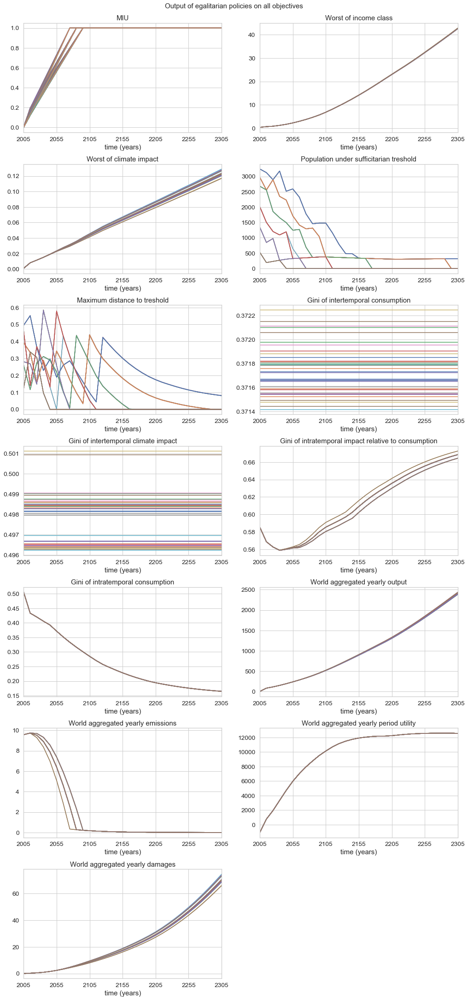

In [49]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 30),constrained_layout=True)
fig.delaxes(axes[6][1])
fig.suptitle("Output of egalitarian policies on all objectives", fontsize=15)
#fig.subplots_adjust(hspace=1, wspace=0.2)

index_1 = [0,0,1,1,2,2,3,3,4,4,5,5,6,6,7,7,8,8]
index_2 = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
position = 0

for i in list(outcomes_dict.keys()):  
    data_sub_plot = outcomes_dict[i]
        
    for policy in range(0,len(data_sub_plot.columns)):        
        if policy == 0:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]]); 
            axes[index_1[position],index_2[position]].set_title(i),
            axes[index_1[position],index_2[position]].set(xlabel='time (years)')
        else:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],secondary_y=False)
    position = position + 1
            
    

### 3.2 Strict sufficitarianism

In [74]:
output_worst_off_income_class = pd.DataFrame(index =region_pop_gr.columns )
output_worst_off_climate_impact = pd.DataFrame(index =region_pop_gr.columns)
output_population_under_treshold =  pd.DataFrame(index =region_pop_gr.columns)
output_max_utility_distance_treshold = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_utility_gini = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_impact_gini = pd.DataFrame(index =region_pop_gr.columns)
output_climate_impact_per_dollar_gini = pd.DataFrame(index =region_pop_gr.columns)
output_utility_intra_gini = pd.DataFrame(index =region_pop_gr.columns)
output_regional_miu = pd.DataFrame(index =region_pop_gr.columns)

output_Y = pd.DataFrame(index =region_pop_gr.columns)
output_E = pd.DataFrame(index =region_pop_gr.columns)
output_U = pd.DataFrame(index =region_pop_gr.columns)
output_D = pd.DataFrame(index =region_pop_gr.columns)
output_T = pd.DataFrame(index =region_pop_gr.columns)

control_sr  = pd.DataFrame(index =region_pop_gr.columns)
control_miu_period  = pd.DataFrame(index =region_pop_gr.columns)
control_irstp  = pd.DataFrame(index =region_pop_gr.columns)

In [75]:
results = results_suf_strict.iloc[:,1:]
results.head()

,sr,irstp,miu_period,sufficitarian_discounting,growth_factor_suf,ini_suf_treshold,Distance to treshold 2055,Population under treshold 2055,Distance to treshold 2105,Population under treshold 2105,Distance to treshold 2155,Population under treshold 2155,Distance to treshold 2205,Population under treshold 2205,Distance to treshold 2305,Population under treshold 2305,Total Aggregated Utility
0,0.27122,0.008866,6,1,1.032319,0.70007,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21311.956114


In [76]:
for i in range(0,len(results.index)):
    model(sr = results.iloc[i,0],miu_period=results.iloc[i,2],irstp = results.iloc[i,1],
          growth_factor_suf =  results.iloc[i,3],  sufficitarian_discounting = results.iloc[i,4])
    
    run_name = "policy" + str(i)

    #standard output
    output_Y[run_name]  = model.global_ouput
    output_E[run_name] = model.E_worldwilde_per_year
    output_U[run_name] = model.global_per_util_ww
    output_D[run_name] = model.global_damages
    output_T[run_name] = model.temp_atm
    
    #alternative objectives
    output_worst_off_income_class[run_name] = model.worst_off_income_class
    output_worst_off_climate_impact[run_name] = model.worst_off_climate_impact
    output_population_under_treshold[run_name] =  model.population_under_treshold
    output_max_utility_distance_treshold[run_name] = model.max_utility_distance_treshold
    output_intertemporal_utility_gini[run_name] = model.intertemporal_utility_gini
    output_intertemporal_impact_gini[run_name] = model.intertemporal_impact_gini 
    output_climate_impact_per_dollar_gini[run_name] = model.climate_impact_per_dollar_gini
    output_utility_intra_gini[run_name] = model.CPC_intra_gini
    for region in range(0,12):
        run_name_region = "policy" + str(i) + "_region_"+ str(region)
        output_regional_miu[run_name_region]  = model.miu[region]

outcomes_dict = {}

outcomes_dict["MIU"] = output_regional_miu


outcomes_dict["Worst of income class"] = output_worst_off_income_class
outcomes_dict["Worst of climate impact"] = output_worst_off_climate_impact
outcomes_dict["Population under sufficitarian treshold"] = output_population_under_treshold
outcomes_dict["Maximum distance to treshold"] = output_max_utility_distance_treshold
outcomes_dict["Gini of intertemporal consumption"] = output_intertemporal_utility_gini
outcomes_dict["Gini of intertemporal climate impact"] = output_intertemporal_impact_gini
outcomes_dict["Gini of intratemporal impact relative to consumption"] = output_climate_impact_per_dollar_gini
outcomes_dict["Gini of intratemporal consumption"] = output_utility_intra_gini
outcomes_dict["World aggregated yearly output"] = output_Y
outcomes_dict["World aggregated yearly emissions"] = output_E
outcomes_dict["World aggregated yearly period utility"] = output_U
outcomes_dict["World aggregated yearly damages"] = output_D
outcomes_dict["Global atmospheric temperature increase"] = output_T

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
prioritarian SWF is used
####################################################################
######################      NEXT STEP      #########################
####################################################################
RICE Reference scenario is used
ygross at t = 2
[20.69850685 20.8172974   5.21996092  2.75656506  1.53574614 16.88790076
  7.40572388  8.76327799  4.35879164 10.35511205  6.57676584  6.92704454]
ygross

In [77]:
average_miu_timestep = pd.DataFrame(index =region_pop_gr.columns , columns = outcomes_dict["Global atmospheric temperature increase"].columns)

regional_miu = outcomes_dict["MIU"]

for row in range(0,31):
    i = 0
    j = 11
    for policies in range(0,len(results)):
        policy_name = "policy" + str(policies)
        mean_miu = regional_miu.iloc[row,i:j].mean()
        average_miu_timestep.iloc[row,policies] = mean_miu
        i = i + 12
        j = j + 12

        average_miu_timestep

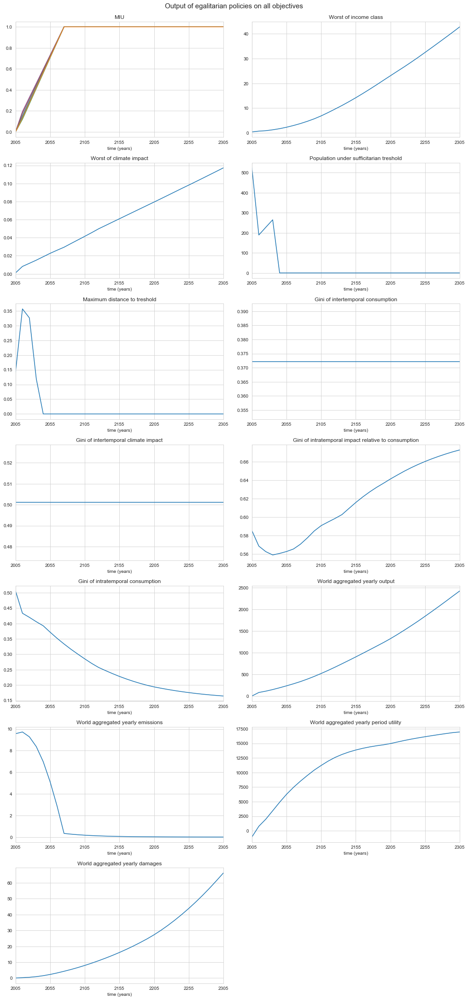

In [78]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 30),constrained_layout=True)
fig.delaxes(axes[6][1])
fig.suptitle("Output of egalitarian policies on all objectives", fontsize=15)
#fig.subplots_adjust(hspace=1, wspace=0.2)

index_1 = [0,0,1,1,2,2,3,3,4,4,5,5,6,6,7,7,8,8]
index_2 = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
position = 0

for i in list(outcomes_dict.keys()):  
    data_sub_plot = outcomes_dict[i]
        
    for policy in range(0,len(data_sub_plot.columns)):        
        if policy == 0:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]]); 
            axes[index_1[position],index_2[position]].set_title(i),
            axes[index_1[position],index_2[position]].set(xlabel='time (years)')
        else:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],secondary_y=False)
    position = position + 1
            
    

### 4 Egalitarian case

In [50]:
output_worst_off_income_class = pd.DataFrame(index =region_pop_gr.columns )
output_worst_off_climate_impact = pd.DataFrame(index =region_pop_gr.columns)
output_population_under_treshold =  pd.DataFrame(index =region_pop_gr.columns)
output_max_utility_distance_treshold = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_utility_gini = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_impact_gini = pd.DataFrame(index =region_pop_gr.columns)
output_climate_impact_per_dollar_gini = pd.DataFrame(index =region_pop_gr.columns)
output_utility_intra_gini = pd.DataFrame(index =region_pop_gr.columns)
output_regional_miu = pd.DataFrame(index =region_pop_gr.columns)

output_Y = pd.DataFrame(index =region_pop_gr.columns)
output_E = pd.DataFrame(index =region_pop_gr.columns)
output_U = pd.DataFrame(index =region_pop_gr.columns)
output_D = pd.DataFrame(index =region_pop_gr.columns)
output_T = pd.DataFrame(index =region_pop_gr.columns)

control_sr  = pd.DataFrame(index =region_pop_gr.columns)
control_miu_period  = pd.DataFrame(index =region_pop_gr.columns)
control_irstp  = pd.DataFrame(index =region_pop_gr.columns)

In [51]:
results = results_ega.iloc[:,1:]
results.head()

,sr,irstp,miu_period,egalitarian_discounting,Intratemporal utility GINI 2055,Intratemporal impact GINI 2055,Intratemporal utility GINI 2105,Intratemporal impact GINI 2105,Intratemporal utility GINI 2155,Intratemporal impact GINI 2155,Intratemporal utility GINI 2205,Intratemporal impact GINI 2205,Intratemporal utility GINI 2305,Intratemporal impact GINI 2305,Intertemporal utility GINI,Intertemporal impact GINI
0,0.469714,0.013705,29,0,0.373921,0.558886,0.288238,0.558586,0.231649,0.557487,0.201569,0.570875,0.184201,0.620517,0.351677,0.576928
1,0.459170,0.002157,30,1,0.373783,0.558819,0.288107,0.558425,0.231652,0.557177,0.201618,0.570091,0.184631,0.618535,0.351883,0.578840
2,0.395256,0.012197,30,1,0.372931,0.558648,0.287246,0.558655,0.231420,0.557672,0.201147,0.570393,0.183210,0.618245,0.355876,0.576526
3,0.100000,0.001281,29,0,0.368005,0.558222,0.279719,0.559658,0.229458,0.560323,0.198068,0.572942,0.173932,0.618508,0.337333,0.541357
4,0.100000,0.009334,23,0,0.368014,0.558491,0.279690,0.561196,0.229211,0.562553,0.197391,0.578737,0.171378,0.631097,0.340026,0.521567


In [52]:
for i in range(0,len(results.index)):
    model(sr = results.iloc[i,0],miu_period=results.iloc[i,2],irstp = results.iloc[i,1],
          egalitarian_discounting =  results.iloc[i,3])
    
    run_name = "policy" + str(i)

    #standard output
    output_Y[run_name]  = model.global_ouput
    output_E[run_name] = model.E_worldwilde_per_year
    output_U[run_name] = model.global_per_util_ww
    output_D[run_name] = model.global_damages
    output_T[run_name] = model.temp_atm
    
    #alternative objectives
    output_worst_off_income_class[run_name] = model.worst_off_income_class
    output_worst_off_climate_impact[run_name] = model.worst_off_climate_impact
    output_population_under_treshold[run_name] =  model.population_under_treshold
    output_max_utility_distance_treshold[run_name] = model.max_utility_distance_treshold
    output_intertemporal_utility_gini[run_name] = model.intertemporal_utility_gini
    output_intertemporal_impact_gini[run_name] = model.intertemporal_impact_gini 
    output_climate_impact_per_dollar_gini[run_name] = model.climate_impact_per_dollar_gini
    output_utility_intra_gini[run_name] = model.CPC_intra_gini
    for region in range(0,12):
        run_name_region = "policy" + str(i) + "_region_"+ str(region)
        output_regional_miu[run_name_region]  = model.miu[region]

outcomes_dict = {}

outcomes_dict["MIU"] = output_regional_miu

outcomes_dict["Worst of income class"] = output_worst_off_income_class
outcomes_dict["Worst of climate impact"] = output_worst_off_climate_impact
outcomes_dict["Population under sufficitarian treshold"] = output_population_under_treshold
outcomes_dict["Maximum distance to treshold"] = output_max_utility_distance_treshold
outcomes_dict["Gini of intertemporal consumption"] = output_intertemporal_utility_gini
outcomes_dict["Gini of intertemporal climate impact"] = output_intertemporal_impact_gini
outcomes_dict["Gini of intratemporal impact relative to consumption"] = output_climate_impact_per_dollar_gini
outcomes_dict["Gini of intratemporal consumption"] = output_utility_intra_gini
outcomes_dict["World aggregated yearly output"] = output_Y
outcomes_dict["World aggregated yearly emissions"] = output_E
outcomes_dict["World aggregated yearly period utility"] = output_U
outcomes_dict["World aggregated yearly damages"] = output_D
outcomes_dict["Global atmospheric temperature increase"] = output_T

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.013704861809761668
[0.87273965 0.87273965 0.87273965 0.87273965 0.87273965 0.87273965
 0.87273965 0.87273965 0.87273965 0.87273965 0.87273965 0.87273965]
0.872739647516915
period utility with WW at t = 1
[ 140.53326338  203.97290382   48.9896135    55.41544385   52.90572042
  648.42976542 -328.10612935  135.33903059 -345.33538938  173.97773421
   60.6920192  -170.48949457]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0021567423130574213
[0.97868622 0.97868622 0.97868622 0.97868622 0.97868622 0.97868622
 0.97868622 0.97868622 0.97868622 0.97868622 0.97868622 0.97868622]
0.978686219727227
period utility with WW at t = 1
[ 157.59335407  228.73427457   54.93672686   62.14262342   59.32823113
  727.14615142 -367.93670176  151.76856535 -387.25751457  195.09782957
   68.0597507  -191.18613371]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.012196730672951695
[0.88583064 0.88583064 0.88583064 0.88583064 0.88583064 0.88583064
 0.88583064 0.88583064 0.88583064 0.88583064 0.88583064 0.88583064]
0.8858306392772266
period utility with WW at t = 1
[ 142.64124575  207.03247332   49.72445192   56.24666897   53.69929999
  658.15613541 -333.02768258  137.36910008 -350.51537948  176.5873797
   61.60239233 -173.04681688]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0012808820477574836
[0.98728096 0.98728096 0.98728096 0.98728096 0.98728096 0.98728096
 0.98728096 0.98728096 0.98728096 0.98728096 0.98728096 0.98728096]
0.9872809553473746
period utility with WW at t = 1
[ 158.97732493  230.7429987    55.41917633   62.68835443   59.84924639
  733.53188446 -371.16788925  153.10138344 -390.65837574  196.81116141
   68.6574454  -192.86511339]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.009334165890825832
[0.91127668 0.91127668 0.91127668 0.91127668 0.91127668 0.91127668
 0.91127668 0.91127668 0.91127668 0.91127668 0.91127668 0.91127668]
0.9112766799713842
period utility with WW at t = 1
[ 146.738705    212.97961096   51.15281799   57.86238982   55.24184606
  677.06208319 -342.59411163  141.31511364 -360.58415359  181.65996293
   63.37195969 -178.01769522]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.010040200617171141
[0.90492671 0.90492671 0.90492671 0.90492671 0.90492671 0.90492671
 0.90492671 0.90492671 0.90492671 0.90492671 0.90492671 0.90492671]
0.9049267058949941
period utility with WW at t = 1
[ 145.71619779  211.49552272   50.79637403   57.4591921    54.85690886
  672.34416736 -340.20684136  140.3303992  -358.0715248   180.39411681
   62.93037009 -176.77722921]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.01287495929290657
[0.87991689 0.87991689 0.87991689 0.87991689 0.87991689 0.87991689
 0.87991689 0.87991689 0.87991689 0.87991689 0.87991689 0.87991689]
0.8799168926932002
period utility with WW at t = 1
[ 141.68898225  205.65033826   49.39249478   55.87116994   53.34080702
  653.76232871 -330.80441186  136.45203308 -348.17536206  175.40849407
   61.19113884 -171.89156781]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0054080704052239205
[0.9474937 0.9474937 0.9474937 0.9474937 0.9474937 0.9474937 0.9474937
 0.9474937 0.9474937 0.9474937 0.9474937 0.9474937]
0.9474936981921049
period utility with WW at t = 1
[ 152.57056536  221.44409449   53.1857928    60.16202424   57.43733179
  703.97067236 -356.20988548  146.93142333 -374.91490862  188.87970457
   65.89056185 -185.09268162]
#########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001106915262417822
[0.98899794 0.98899794 0.98899794 0.98899794 0.98899794 0.98899794
 0.98899794 0.98899794 0.98899794 0.98899794 0.98899794 0.98899794]
0.9889979394454884
period utility with WW at t = 1
[ 159.25380301  231.14428473   55.51555603   62.79737599   59.95333045
  734.80757257 -371.81338875  153.36764264 -391.33777122  197.15343646
   68.77684783 -193.20052585]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008598932495497374
[0.9179414 0.9179414 0.9179414 0.9179414 0.9179414 0.9179414 0.9179414
 0.9179414 0.9179414 0.9179414 0.9179414 0.9179414]
0.9179414020607451
period utility with WW at t = 1
[ 147.81189463  214.53726074   51.52692974   58.28557276   55.64586337
  682.0138511  -345.0997113   142.34863724 -363.22132541  182.98855302
   63.83543747 -179.31964719]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0010586922160763404
[0.98947446 0.98947446 0.98947446 0.98947446 0.98947446 0.98947446
 0.98947446 0.98947446 0.98947446 0.98947446 0.98947446 0.98947446]
0.9894744632863726
period utility with WW at t = 1
[ 159.33053546  231.2556558    55.54230481   62.82763333   59.98221745
  735.16162116 -371.99253771  153.44153899 -391.5263275   197.24842989
   68.80998623 -193.29361467]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.00885525626654286
[0.91561182 0.91561182 0.91561182 0.91561182 0.91561182 0.91561182
 0.91561182 0.91561182 0.91561182 0.91561182 0.91561182 0.91561182]
0.9156118174392351
period utility with WW at t = 1
[ 147.4367723   213.99280038   51.39616285   58.13765354   55.5046433
  680.28301188 -344.22390487  141.98737977 -362.2995293   182.52415811
   63.67343361 -178.86456336]
################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008264246252850833
[0.920993 0.920993 0.920993 0.920993 0.920993 0.920993 0.920993 0.920993
 0.920993 0.920993 0.920993 0.920993]
0.9209929996732189
period utility with WW at t = 1
[ 148.3032794   215.25046682   51.69822549   58.47933689   55.83085206
  684.28113291 -346.24695823  142.82186    -364.4288157   183.59687882
   64.04765153 -179.9157761 ]
######################################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.007394873289061931
[0.92897203 0.92897203 0.92897203 0.92897203 0.92897203 0.92897203
 0.92897203 0.92897203 0.92897203 0.92897203 0.92897203 0.92897203]
0.9289720259302365
period utility with WW at t = 1
[ 149.58810541  217.11529004   52.14611325   58.98597284   56.31454286
  690.20940503 -349.24667003  144.05919771 -367.58604609  185.18747106
   64.6025286  -181.47447709]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.003727015322566869
[0.96348258 0.96348258 0.96348258 0.96348258 0.96348258 0.96348258
 0.96348258 0.96348258 0.96348258 0.96348258 0.96348258 0.96348258]
0.9634825791431508
period utility with WW at t = 1
[ 155.14518154  225.18094601   54.08329884   61.17725363   58.4065822
  715.85012158 -362.22089902  149.41087943 -381.24156794  192.06703459
   67.00245985 -188.21610593]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008864610972018938
[0.91552692 0.91552692 0.91552692 0.91552692 0.91552692 0.91552692
 0.91552692 0.91552692 0.91552692 0.91552692 0.91552692 0.91552692]
0.9155269207999743
period utility with WW at t = 1
[ 147.42310179  213.97295871   51.39139734   58.13226295   55.49949684
  680.21993521 -344.19198801  141.97421452 -362.26593644  182.50723425
   63.66752973 -178.84797882]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.007547264630127179
[0.92756791 0.92756791 0.92756791 0.92756791 0.92756791 0.92756791
 0.92756791 0.92756791 0.92756791 0.92756791 0.92756791 0.92756791]
0.927567913363618
period utility with WW at t = 1
[ 149.3620076   216.78712697   52.06729601   58.89681736   56.22942516
  689.1661748  -348.71879446  143.84145668 -367.03045112  184.90756591
   64.50488387 -181.20018402]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008339029726751138
[0.92031017 0.92031017 0.92031017 0.92031017 0.92031017 0.92031017
 0.92031017 0.92031017 0.92031017 0.92031017 0.92031017 0.92031017]
0.9203101730451425
period utility with WW at t = 1
[ 148.19332696  215.09087956   51.65989629   58.43598015   55.78945892
  683.77380508 -345.99024982  142.7159715  -364.15862721  183.46075961
   64.00016643 -179.78238607]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.007588378370289428
[0.9271895 0.9271895 0.9271895 0.9271895 0.9271895 0.9271895 0.9271895
 0.9271895 0.9271895 0.9271895 0.9271895 0.9271895]
0.9271894970845215
period utility with WW at t = 1
[ 149.30107297  216.69868517   52.04605432   58.87278945   56.20648546
  688.88501835 -348.57652901  143.78277424 -366.88071513  184.83212988
   64.47856806 -181.12626048]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.004415419239775889
[0.95689941 0.95689941 0.95689941 0.95689941 0.95689941 0.95689941
 0.95689941 0.95689941 0.95689941 0.95689941 0.95689941 0.95689941]
0.9568994138406115
period utility with WW at t = 1
[ 154.08512462  223.64235733   53.71376512   60.75924921   58.00750889
  710.95894889 -359.7459606   148.39000315 -378.63666743  190.75470257
   66.54465368 -186.93008606]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.009097849456121208
[0.91341301 0.91341301 0.91341301 0.91341301 0.91341301 0.91341301
 0.91341301 0.91341301 0.91341301 0.91341301 0.91341301 0.91341301]
0.9134130113611215
period utility with WW at t = 1
[ 147.08270864  213.47890501   51.27273697   57.99803823   55.37135106
  678.64933875 -343.39726459  141.64640261 -361.4294811   182.08583346
   63.52052434 -178.43502708]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006526900878098073
[0.93701412 0.93701412 0.93701412 0.93701412 0.93701412 0.93701412
 0.93701412 0.93701412 0.93701412 0.93701412 0.93701412 0.93701412]
0.9370141186557104
period utility with WW at t = 1
[ 150.88308672  218.99485287   52.59754114   59.49661326   56.80205676
  696.1845344  -352.27009165  145.30631538 -370.76823133  186.79063538
   65.16179143 -183.0454981 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008446562730755959
[0.9193293 0.9193293 0.9193293 0.9193293 0.9193293 0.9193293 0.9193293
 0.9193293 0.9193293 0.9193293 0.9193293 0.9193293]
0.9193292956502647
period utility with WW at t = 1
[ 148.03538077  214.86163317   51.60483656   58.3736984    55.72999786
  683.04503092 -345.62148935  142.56386314 -363.77050267  183.26522498
   63.9319543  -179.59077189]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008136249078480975
[0.922163 0.922163 0.922163 0.922163 0.922163 0.922163 0.922163 0.922163
 0.922163 0.922163 0.922163 0.922163]
0.9221629990306518
period utility with WW at t = 1
[ 148.49167903  215.52391397   51.76390122   58.55362712   55.90177775
  685.15042126 -346.68681903  143.00329622 -364.89177413  183.83011428
   64.12901557 -180.14433521]
######################################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0062002639781661905
[0.94006034 0.94006034 0.94006034 0.94006034 0.94006034 0.94006034
 0.94006034 0.94006034 0.94006034 0.94006034 0.94006034 0.94006034]
0.9400603400212271
period utility with WW at t = 1
[ 151.37360578  219.70680244   52.7685351    59.69003601   56.98671954
  698.44782175 -353.41531738  145.77870442 -371.97359428  187.39788944
   65.37363161 -183.64057676]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0047347239382593154
[0.95386273 0.95386273 0.95386273 0.95386273 0.95386273 0.95386273
 0.95386273 0.95386273 0.95386273 0.95386273 0.95386273 0.95386273]
0.9538627327610905
period utility with WW at t = 1
[ 153.59614179  222.93263747   53.54330669   60.56643222   57.82342443
  708.70274979 -358.60432153  147.91909355 -377.43507948  190.14935034
   66.33347695 -186.33687109]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.009396561076239792
[0.91071354 0.91071354 0.91071354 0.91071354 0.91071354 0.91071354
 0.91071354 0.91071354 0.91071354 0.91071354 0.91071354 0.91071354]
0.9107135369414389
period utility with WW at t = 1
[ 146.64802466  212.84799563   51.121207     57.82663251   55.20770817
  676.64367811 -342.38239823  141.22778492 -360.36132286  181.54770225
   63.33279762 -177.90768536]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008350476395320841
[0.92020571 0.92020571 0.92020571 0.92020571 0.92020571 0.92020571
 0.92020571 0.92020571 0.92020571 0.92020571 0.92020571 0.92020571]
0.9202057059212874
period utility with WW at t = 1
[ 148.1765051   215.06646396   51.65403222   58.42934691   55.7831261
  683.69618789 -345.95097545  142.69977139 -364.11729049  183.43993444
   63.99290158 -179.76197844]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.014934702789369366
[0.86222176 0.86222176 0.86222176 0.86222176 0.86222176 0.86222176
 0.86222176 0.86222176 0.86222176 0.86222176 0.86222176 0.86222176]
0.862221757631038
period utility with WW at t = 1
[ 138.8396158   201.51470847   48.39921135   54.74760031   52.26812301
  640.61516356 -324.15193275  133.70798171 -341.17355301  171.88102798
   59.9605846  -168.43482714]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008206066955080013
[0.9215246 0.9215246 0.9215246 0.9215246 0.9215246 0.9215246 0.9215246
 0.9215246 0.9215246 0.9215246 0.9215246 0.9215246]
0.9215246037174175
period utility with WW at t = 1
[ 148.38888116  215.374711     51.72806609   58.5130916    55.86307805
  684.67610509 -346.44681456  142.90429785 -364.63916673  183.70285231
   64.08462031 -180.01962483]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008333561885540287
[0.92036008 0.92036008 0.92036008 0.92036008 0.92036008 0.92036008
 0.92036008 0.92036008 0.92036008 0.92036008 0.92036008 0.92036008]
0.9203600794736915
period utility with WW at t = 1
[ 148.20136316  215.10254347   51.66269769   58.43914901   55.79248426
  683.81088465 -346.00901213  142.72371068 -364.17837475  183.47070829
   64.00363702 -179.79213528]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.008445148078410158
[0.91934219 0.91934219 0.91934219 0.91934219 0.91934219 0.91934219
 0.91934219 0.91934219 0.91934219 0.91934219 0.91934219 0.91934219]
0.9193421921331012
period utility with WW at t = 1
[ 148.03745743  214.86464728   51.60556048   58.37451727   55.73077965
  683.05461278 -345.62633778  142.56586305 -363.7756057   183.26779585
   63.93285115 -179.59329122]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0068874428570360096
[0.9336643 0.9336643 0.9336643 0.9336643 0.9336643 0.9336643 0.9336643
 0.9336643 0.9336643 0.9336643 0.9336643 0.9336643]
0.9336642995424445
period utility with WW at t = 1
[ 150.34368071  218.21194776   52.40950529   59.28391327   56.59898979
  693.69567941 -351.01072846  144.78684629 -369.44273742  186.12286013
   64.92883846 -182.39111169]
#########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.010279742456620384
[0.90278337 0.90278337 0.90278337 0.90278337 0.90278337 0.90278337
 0.90278337 0.90278337 0.90278337 0.90278337 0.90278337 0.90278337]
0.9027833721231361
period utility with WW at t = 1
[ 145.37106658  210.99459209   50.67606198   57.32309906   54.72697937
  670.75170915 -339.40105587  139.99802434 -357.22342651  179.96685038
   62.78131847 -176.35852944]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006313961708682505
[0.93899876 0.93899876 0.93899876 0.93899876 0.93899876 0.93899876
 0.93899876 0.93899876 0.93899876 0.93899876 0.93899876 0.93899876]
0.938998758792078
period utility with WW at t = 1
[ 151.20266422  219.45869431   52.70894521   59.62262989   56.92236619
  697.65908611 -353.01621633  145.61408102 -371.55353594  187.18626677
   65.29980718 -183.43319711]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.01218194975711075
[0.88596001 0.88596001 0.88596001 0.88596001 0.88596001 0.88596001
 0.88596001 0.88596001 0.88596001 0.88596001 0.88596001 0.88596001]
0.8859600058261848
period utility with WW at t = 1
[ 142.66207705  207.0627083    49.73171367   56.25488323   53.70714222
  658.25225242 -333.07631789  137.38916144 -350.56656868  176.61316849
   61.61138873 -173.0720886 ]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006910940242297743
[0.93344644 0.93344644 0.93344644 0.93344644 0.93344644 0.93344644
 0.93344644 0.93344644 0.93344644 0.93344644 0.93344644 0.93344644]
0.9334464414858517
period utility with WW at t = 1
[ 150.30860003  218.16103092   52.39727623   59.27008016   56.58578317
  693.53381482 -350.92882481  144.75306222 -369.3565329   186.07943086
   64.91368819 -182.34855317]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.001961343171818948
[0.9805965 0.9805965 0.9805965 0.9805965 0.9805965 0.9805965 0.9805965
 0.9805965 0.9805965 0.9805965 0.9805965 0.9805965]
0.9805964965860965
period utility with WW at t = 1
[ 157.90095719  229.18073615   55.0439567    62.26391829   59.44403264
  728.56545256 -368.65486959  152.06479919 -388.0133943   195.47863688
   68.19259509 -191.55930587]
##########################################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0017139926342377295
[0.98302055 0.98302055 0.98302055 0.98302055 0.98302055 0.98302055
 0.98302055 0.98302055 0.98302055 0.98302055 0.98302055 0.98302055]
0.9830205494203675
period utility with WW at t = 1
[ 158.2912913   229.74727521   55.18002638   62.41783585   59.5909794
  730.36647995 -369.56619131  152.44070621 -388.97257065  195.96186372
   68.36116845 -192.03284404]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006331301165940439
[0.93883698 0.93883698 0.93883698 0.93883698 0.93883698 0.93883698
 0.93883698 0.93883698 0.93883698 0.93883698 0.93883698 0.93883698]
0.9388369784077071
period utility with WW at t = 1
[ 151.17661347  219.4208837    52.69986397   59.61235749   56.91255902
  697.53888621 -352.95539506  145.58899312 -371.48952087  187.15401639
   65.28855665 -183.40159335]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.005393444425196929
[0.94763154 0.94763154 0.94763154 0.94763154 0.94763154 0.94763154
 0.94763154 0.94763154 0.94763154 0.94763154 0.94763154 0.94763154]
0.9476315440395886
period utility with WW at t = 1
[ 152.59276205  221.47631122   53.19353052   60.1707769    57.44568804
  704.07308933 -356.26170857  146.9527996  -374.96945301  188.90718368
   65.90014792 -185.11960977]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0058370805936573894
[0.94346019 0.94346019 0.94346019 0.94346019 0.94346019 0.94346019
 0.94346019 0.94346019 0.94346019 0.94346019 0.94346019 0.94346019]
0.9434601905628841
period utility with WW at t = 1
[ 151.92106812  220.50140068   52.95937937   59.9059128    57.19281943
  700.97384918 -354.69348986  146.30593208 -373.31888519  188.07563829
   65.61006385 -184.30473681]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006457573116383054
[0.93765976 0.93765976 0.93765976 0.93765976 0.93765976 0.93765976
 0.93765976 0.93765976 0.93765976 0.93765976 0.93765976 0.93765976]
0.9376597616830742
period utility with WW at t = 1
[ 150.98705166  219.14574974   52.63378311   59.53760898   56.84119582
  696.66423549 -352.51282089  145.40643768 -371.02370658  186.91934217
   65.2066907  -183.17162432]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0012200995501811447
[0.98788048 0.98788048 0.98788048 0.98788048 0.98788048 0.98788048
 0.98788048 0.98788048 0.98788048 0.98788048 0.98788048 0.98788048]
0.9878804818530916
period utility with WW at t = 1
[ 159.07386394  230.88311742   55.45282963   62.72642194   59.88558986
  733.9773218  -371.39328101  153.19435428 -390.89560309  196.93067502
   68.69913764 -192.98223076]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006742765394480283
[0.93500692 0.93500692 0.93500692 0.93500692 0.93500692 0.93500692
 0.93500692 0.93500692 0.93500692 0.93500692 0.93500692 0.93500692]
0.935006922252195
period utility with WW at t = 1
[ 150.55987709  218.52573968   52.48487091   59.36916439   56.68037995
  694.69322379 -351.51548694  144.99505186 -369.97400139  186.39050748
   65.02220707 -182.65339274]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.005513642161117346
[0.94649937 0.94649937 0.94649937 0.94649937 0.94649937 0.94649937
 0.94649937 0.94649937 0.94649937 0.94649937 0.94649937 0.94649937]
0.9464993673131884
period utility with WW at t = 1
[ 152.41045282  221.21170382   53.12997789   60.09888825   57.37705517
  703.23190251 -355.83606717  146.77722868 -374.52146065  188.68148803
   65.82141414 -184.8984393 ]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.012463137155605009
[0.88350254 0.88350254 0.88350254 0.88350254 0.88350254 0.88350254
 0.88350254 0.88350254 0.88350254 0.88350254 0.88350254 0.88350254]
0.8835025368326221
period utility with WW at t = 1
[ 142.26636209  206.48835937   49.59376823   56.09884387   53.55816977
  656.42639742 -332.15243338  137.00807245 -349.59416985  176.12328025
   61.44049154 -172.59202259]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006821680658736965
[0.93427432 0.93427432 0.93427432 0.93427432 0.93427432 0.93427432
 0.93427432 0.93427432 0.93427432 0.93427432 0.93427432 0.93427432]
0.9342743168679122
period utility with WW at t = 1
[ 150.44190901  218.35451835   52.44374747   59.3226469    56.63596921
  694.14891125 -351.24006424  144.88144398 -369.6841159   186.24446505
   64.97126026 -182.51027844]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0076587444011853014
[0.92654223 0.92654223 0.92654223 0.92654223 0.92654223 0.92654223
 0.92654223 0.92654223 0.92654223 0.92654223 0.92654223 0.92654223]
0.9265422328484924
period utility with WW at t = 1
[ 149.19684697  216.5474094    52.00972135   58.83169079   56.16724812
  688.40411274 -348.33319027  143.68240053 -366.62459837  184.70309992
   64.43355604 -180.99981756]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.006188250616497363
[0.94017258 0.94017258 0.94017258 0.94017258 0.94017258 0.94017258
 0.94017258 0.94017258 0.94017258 0.94017258 0.94017258 0.94017258]
0.9401725843416034
period utility with WW at t = 1
[ 151.39167997  219.7330357    52.77483572   59.69716307   56.99352383
  698.53121725 -353.45751559  145.79611057 -372.01800837  187.42026497
   65.3814373  -183.66250367]
##############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.0028853819645501275
[0.97159884 0.97159884 0.97159884 0.97159884 0.97159884 0.97159884
 0.97159884 0.97159884 0.97159884 0.97159884 0.97159884 0.97159884]
0.9715988432656416
period utility with WW at t = 1
[ 156.45210634  227.07784386   54.5388902    61.69260363   58.89859239
  721.88035896 -365.27220535  150.66949914 -384.45310215  193.68498474
   67.56688071 -189.80161631]
#############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.005948220413407514
[0.94241835 0.94241835 0.94241835 0.94241835 0.94241835 0.94241835
 0.94241835 0.94241835 0.94241835 0.94241835 0.94241835 0.94241835]
0.9424183488726728
period utility with WW at t = 1
[ 151.75330513  220.25790599   52.90089753   59.83976005   57.1296627
  700.19977966 -354.30180988  146.14436975 -372.90663761  187.86795063
   65.53761215 -184.10121327]
###############################

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.011209285443104722
[0.89451888 0.89451888 0.89451888 0.89451888 0.89451888 0.89451888
 0.89451888 0.89451888 0.89451888 0.89451888 0.89451888 0.89451888]
0.8945188798475032
period utility with WW at t = 1
[ 144.04027329  209.06305101   50.21215011   56.79833717   54.22598355
  664.61134094 -336.29402323  138.71641833 -353.95323973  178.31935144
   62.20658954 -174.74406273]
##############################

In [53]:
average_miu_timestep = pd.DataFrame(index =region_pop_gr.columns , columns = outcomes_dict["Global atmospheric temperature increase"].columns)

regional_miu = outcomes_dict["MIU"]

for row in range(0,31):
    i = 0
    j = 11
    for policies in range(0,len(results)):
        policy_name = "policy" + str(policies)
        mean_miu = regional_miu.iloc[row,i:j].mean()
        average_miu_timestep.iloc[row,policies] = mean_miu
        i = i + 12
        j = j + 12

        average_miu_timestep

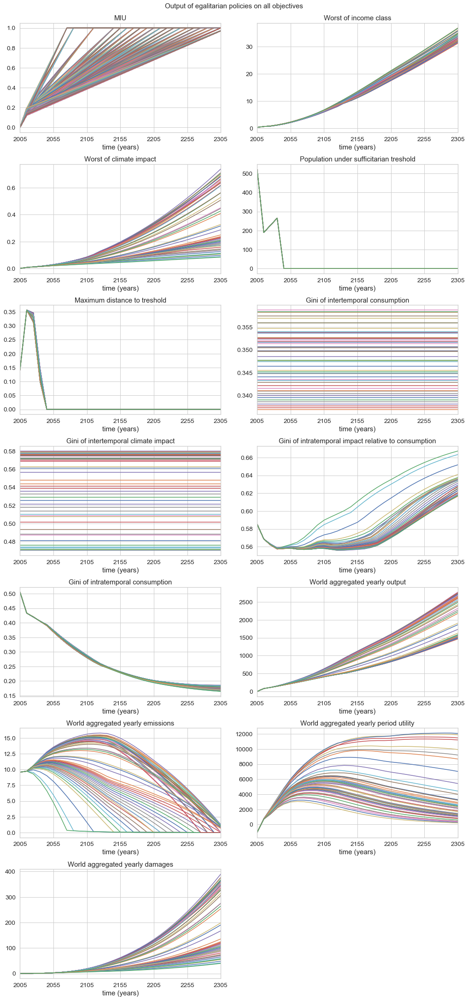

In [54]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 30),constrained_layout=True)
fig.delaxes(axes[6][1])
fig.suptitle("Output of egalitarian policies on all objectives", fontsize=15)
#fig.subplots_adjust(hspace=1, wspace=0.2)

index_1 = [0,0,1,1,2,2,3,3,4,4,5,5,6,6,7,7,8,8]
index_2 = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
position = 0

for i in list(outcomes_dict.keys()):  
    data_sub_plot = outcomes_dict[i]
        
    for policy in range(0,len(data_sub_plot.columns)):        
        if policy == 0:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]]); 
            axes[index_1[position],index_2[position]].set_title(i),
            axes[index_1[position],index_2[position]].set(xlabel='time (years)')
        else:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],secondary_y=False)
    position = position + 1
            
    

### 5 Utilitarian case

In [92]:
output_worst_off_income_class = pd.DataFrame(index =region_pop_gr.columns )
output_worst_off_climate_impact = pd.DataFrame(index =region_pop_gr.columns)
output_population_under_treshold =  pd.DataFrame(index =region_pop_gr.columns)
output_max_utility_distance_treshold = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_utility_gini = pd.DataFrame(index =region_pop_gr.columns)
output_intertemporal_impact_gini = pd.DataFrame(index =region_pop_gr.columns)
output_climate_impact_per_dollar_gini = pd.DataFrame(index =region_pop_gr.columns)
output_utility_intra_gini = pd.DataFrame(index =region_pop_gr.columns)
output_regional_miu = pd.DataFrame(index =region_pop_gr.columns)

output_Y = pd.DataFrame(index =region_pop_gr.columns)
output_E = pd.DataFrame(index =region_pop_gr.columns)
output_U = pd.DataFrame(index =region_pop_gr.columns)
output_D = pd.DataFrame(index =region_pop_gr.columns)
output_T = pd.DataFrame(index =region_pop_gr.columns)

control_sr  = pd.DataFrame(index =region_pop_gr.columns)
control_miu_period  = pd.DataFrame(index =region_pop_gr.columns)
control_irstp  = pd.DataFrame(index =region_pop_gr.columns)

In [95]:
results = results_util.iloc[:,1:]
len(results)

30098

In [ ]:
for i in range(0,len(results.index)):
    model(sr = results.iloc[i,0],miu_period=results.iloc[i,2],irstp = results.iloc[i,1])
    
    run_name = "policy" + str(i)
    
    #standard output
    output_Y[run_name]  = model.global_ouput
    output_E[run_name] = model.E_worldwilde_per_year
    output_U[run_name] = model.global_per_util_ww
    output_D[run_name] = model.global_damages
    output_T[run_name] = model.temp_atm
    
    #alternative objectives
    output_worst_off_income_class[run_name] = model.worst_off_income_class
    output_worst_off_climate_impact[run_name] = model.worst_off_climate_impact
    output_population_under_treshold[run_name] =  model.population_under_treshold
    output_max_utility_distance_treshold[run_name] = model.max_utility_distance_treshold
    output_intertemporal_utility_gini[run_name] = model.intertemporal_utility_gini
    output_intertemporal_impact_gini[run_name] = model.intertemporal_impact_gini 
    output_climate_impact_per_dollar_gini[run_name] = model.climate_impact_per_dollar_gini
    output_utility_intra_gini[run_name] = model.CPC_intra_gini
    
    
outcomes_dict = {}

outcomes_dict["Worst of income class"] = output_worst_off_income_class
outcomes_dict["Worst of climate impact"] = output_worst_off_climate_impact
outcomes_dict["Population under sufficitarian treshold"] = output_population_under_treshold
outcomes_dict["Maximum distance to treshold"] = output_max_utility_distance_treshold
outcomes_dict["Gini of intertemporal consumption"] = output_intertemporal_utility_gini
outcomes_dict["Gini of intertemporal climate impact"] = output_intertemporal_impact_gini
outcomes_dict["Gini of intratemporal impact relative to consumption"] = output_climate_impact_per_dollar_gini
outcomes_dict["Gini of intratemporal consumption"] = output_utility_intra_gini
outcomes_dict["World aggregated yearly output"] = output_Y
outcomes_dict["World aggregated yearly emissions"] = output_E
outcomes_dict["World aggregated yearly period utility"] = output_U
outcomes_dict["World aggregated yearly damages"] = output_D
outcomes_dict["Global atmospheric temperature increase"] = output_T

In [ ]:
average_miu_timestep = pd.DataFrame(index =region_pop_gr.columns , columns = outcomes_dict["Global atmospheric temperature increase"].columns)

regional_miu = outcomes_dict["MIU"]

for row in range(0,31):
    i = 0
    j = 11
    for policies in range(0,len(results)):
        policy_name = "policy" + str(policies)
        mean_miu = regional_miu.iloc[row,i:j].mean()
        average_miu_timestep.iloc[row,policies] = mean_miu
        i = i + 12
        j = j + 12

        average_miu_timestep

In [ ]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(14, 30),constrained_layout=True)
fig.delaxes(axes[6][1])
fig.suptitle("Output of egalitarian policies on all objectives", fontsize=15)
#fig.subplots_adjust(hspace=1, wspace=0.2)

index_1 = [0,0,1,1,2,2,3,3,4,4,5,5,6,6,7,7,8,8]
index_2 = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
position = 0

for i in list(outcomes_dict.keys()):  
    data_sub_plot = outcomes_dict[i]
        
    for policy in range(0,len(data_sub_plot.columns)):        
        if policy == 0:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]]); 
            axes[index_1[position],index_2[position]].set_title(i),
            axes[index_1[position],index_2[position]].set(xlabel='time (years)')
        else:
            data_sub_plot.iloc[:,policy].plot(ax=axes[index_1[position],index_2[position]],secondary_y=False)
    position = position + 1
            
    

## La montagne like color bar scatter plots

# run this for every principle

get controls of every run

In [186]:
controls = pd.DataFrame()
controls["savings rate"] = results.iloc[:,14]
controls["emission control rate target year"] = 2005 + 10 * results.iloc[:,13]
controls["social rate of time preference"] = results.iloc[:,12]
controls = controls.reset_index()
controls['policy'] = 'policy' + controls['index'].astype(str)
controls = controls.iloc[:,1:]

In [187]:
#prioritarian objectives
df_worst_off_climate_impact = outcomes_dict["Worst of climate impact"]
df_worst_off_income_class = outcomes_dict["Worst of income class"]
df_damages = outcomes_dict["World aggregated yearly damages"]
df_temp_atm = outcomes_dict["Global atmospheric temperature increase"]

#sufficitarian objectives
df_suf_population = outcomes_dict["Population under sufficitarian treshold"] 
df_suf_distance = outcomes_dict["Maximum distance to treshold"] 

#egalitarian objectives
df_gini_intertemporal_consumption = outcomes_dict["Gini of intertemporal consumption"] 
df_gini_intertemporal_impact =  outcomes_dict["Gini of intertemporal climate impact"] 
df_gini_intra_impact = outcomes_dict["Gini of intratemporal impact relative to consumption"] 
df_gini_intra_consuption = outcomes_dict["Gini of intratemporal consumption"]

#utilitarian objectives
df_period_utility = outcomes_dict["World aggregated yearly period utility"] 
df_yearly_damages = outcomes_dict["World aggregated yearly damages"] 

#utilitarian objectives
df_miu_period = results.iloc[:,2]
#outcome_to_plot = pd.concat([df1, s1], axis=1)

In [44]:
from functools import reduce

#prio
df_impact_stacked = df_worst_off_climate_impact.stack().to_frame().reset_index()
df_income_stacked = df_worst_off_income_class.stack().to_frame().reset_index()

#general
df_damages_stacked = df_damages.stack().to_frame().reset_index()
df_temp_atm_stacked = df_temp_atm.stack().to_frame().reset_index()

#sufficitarian objectives
df_suf_population_stacked = df_suf_population.stack().to_frame().reset_index()
df_suf_distance_stacked =df_suf_distance.stack().to_frame().reset_index()

#egalitarian objectives
df_gini_intertemporal_consumption_stacked = df_gini_intertemporal_consumption.stack().to_frame().reset_index()
df_gini_intertemporal_impact_stacked =  df_gini_intertemporal_impact.stack().to_frame().reset_index()
df_gini_intra_impact_stacked = df_gini_intra_impact.stack().to_frame().reset_index()
df_gini_intra_consuption_stacked = df_gini_intra_consuption.stack().to_frame().reset_index()

#utilitarian objectives
df_period_utility_stacked = df_period_utility.stack().to_frame().reset_index()
df_yearly_damages_stacked = df_yearly_damages.stack().to_frame().reset_index()

#sufficitarian objectives
df_suf_population_stacked.columns = ["year","policy",'population']
df_suf_distance_stacked.columns = ["year","policy",'distance']

#egalitarian objectives
df_gini_intertemporal_consumption_stacked.columns = ["year","policy",'gini_inter_con']
df_gini_intertemporal_impact_stacked.columns = ["year","policy",'gini_inter_impact']
df_gini_intra_impact_stacked.columns = ["year","policy",'gini_intra_impact']
df_gini_intra_consuption_stacked.columns = ["year","policy",'gini_intra_con']

#utilitarian objectives
df_period_utility_stacked.columns = ["year","policy",'period_utility']
df_yearly_damages_stacked.columns = ["year","policy",'damages']

df_impact_stacked.columns = ["year","policy",'impact']
df_income_stacked.columns = ["year","policy",'income']

df_damages_stacked.columns = ["year","policy",'damages']
df_temp_atm_stacked.columns = ["year","policy",'temp_atm']
#df_gini_intertemporal_consumption_stacked
#df_gini_intertemporal_impact_stacked
#controls

merge_list = [df_period_utility_stacked,df_yearly_damages_stacked,df_suf_population_stacked,df_suf_distance_stacked,
              df_gini_intra_impact_stacked,df_gini_intra_consuption_stacked,df_impact_stacked,
              df_income_stacked,df_damages_stacked,df_temp_atm_stacked,df_gini_intertemporal_impact_stacked,
              df_gini_intertemporal_consumption_stacked]

df_merged = pd.concat(merge_list,axis =1)

i = np.unique(df_merged.columns, return_index=True)
df_merged = df_merged.iloc[:,i[1]]
df_merged = pd.merge(df_merged,controls,on=['policy'])

NameError: name 'df_worst_off_climate_impact' is not defined

In [189]:
df_merged = df_merged.astype({'damages':float, 'distance':float, 'gini_inter_con':float, 'gini_inter_impact':float,
       'gini_intra_con':float, 'gini_intra_impact':float, 'impact':float, 'income':float,
       'period_utility':float, 'policy':str, 'population':float, 'temp_atm':float, 'year':str,
       'savings rate':float, 'emission control rate target year':float,
       'social rate of time preference':float})

In [190]:
df_merged

,damages,distance,gini_inter_con,gini_inter_impact,gini_intra_con,gini_intra_impact,impact,income,period_utility,policy,population,temp_atm,year,savings rate,emission control rate target year,social rate of time preference
0,0.000000,0.494838,0.371487,0.496355,0.505547,0.585386,0.000980,0.389919,-1070.654524,policy0,3243.746052,0.830000,2005,0.267812,2085.0,0.001
1,0.245626,0.552153,0.371487,0.496355,0.433054,0.568593,0.008163,0.691963,767.236843,policy0,3125.062594,0.980000,2015,0.267812,2085.0,0.001
2,0.485982,0.366126,0.371487,0.496355,0.419808,0.562550,0.011618,0.873254,1949.030174,policy0,2892.897446,1.194062,2025,0.267812,2085.0,0.001
3,0.897840,0.229366,0.371487,0.496355,0.405504,0.558646,0.015226,1.236886,3340.877329,policy0,3176.585655,1.423526,2035,0.267812,2085.0,0.001
4,1.523395,0.296286,0.371487,0.496355,0.392276,0.559863,0.019267,1.695541,4719.293607,policy0,2516.987004,1.647524,2045,0.267812,2085.0,0.001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1080,53.430442,0.000000,0.371530,0.496435,0.173223,0.653935,0.110581,34.296444,12580.544924,policy34,0.000000,1.823854,2265,0.269029,2085.0,0.001
1081,58.081530,0.000000,0.371530,0.496435,0.170781,0.656909,0.114665,36.319400,12593.859225,policy34,0.000000,1.813793,2275,0.269029,2085.0,0.001
1082,62.991101,0.000000,0.371530,0.496435,0.168609,0.659650,0.118774,38.361247,12598.960583,policy34,0.000000,1.805093,2285,0.269029,2085.0,0.001
1083,68.166072,0.000000,0.371530,0.496435,0.166666,0.662187,0.122898,40.423278,12595.873660,policy34,0.000000,1.797537,2295,0.269029,2085.0,0.001


### get results from Nordhaus optimal run

In [191]:
model = PyRICE(model_specification="EMA",welfare_function="utilitarian")

In [192]:
model(sr = nordhaus_policy.iloc[0,31],miu_period=nordhaus_policy.iloc[0,32],irstp = nordhaus_policy.iloc[0,30])

damage function used:0
RICE Reference scenario is used
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
ygross at t = 1
[15.97331329 16.38071347  4.42562463  2.24695863  1.09321548 11.94050574
  4.60054419  5.7670217   2.45678464  7.11729629  5.09414936  4.17926155]
Nordhaus is used
Gross product at t = 1
[15.94811384 16.33609135  4.41754973  2.24336758  1.0912067  11.8760077
  4.57192902  5.73900195  2.44134182  7.10293135  5.0777975   4.16383755]
utilitarian SWF is used
0.015
[0.86166723 0.86166723 0.86166723 0.86166723 0.86166723 0.86166723
 0.86166723 0.86166723 0.86166723 0.86166723 0.86166723 0.86166723]
0.8616672317221843
period utility with WW at t = 1
[ 138.75032303  201.3851071    48.36808407   54.71239016   52.23450749
  640.20316085 -323.94345896  133.62198929 -340.954132    171.7704851
   59.92202179 -168.32650063]
##############################################

{'Damages 2005': 0.0,
 'Utility 2005': -1070.6545235875724,
 'Damages 2055': 2.4634984637309993,
 'Utility 2055': 2998.636040283438,
 'Damages 2105': 11.597155192362465,
 'Utility 2105': 2529.6905078330083,
 'Damages 2155': 25.312728006068653,
 'Utility 2155': 1478.6070388370713,
 'Damages 2205': 40.00443101014845,
 'Utility 2205': 759.1918911554919,
 'Damages 2305': 89.94803719673935,
 'Utility 2305': 194.23722814366894,
 'Total Aggregated Utility': 2255.0112446066987,
 'Lowest income per capita 2005': 0.38991853536284493,
 'Highest climate impact per capita 2005': 0.0009799789132117502,
 'Lowest income per capita 2055': 2.293577307575063,
 'Highest climate impact per capita 2055': 0.024233262276753632,
 'Lowest income per capita 2105': 6.836374476088231,
 'Highest climate impact per capita 2105': 0.04980806135948819,
 'Lowest income per capita 2155': 13.803005587995006,
 'Highest climate impact per capita 2155': 0.07774012019775738,
 'Lowest income per capita 2205': 22.40985914555251

In [193]:
k = pd.DataFrame(data = model.miu)
h = k.sum(axis=0) / 12
nordhaus = h.to_frame()

nordhaus= nordhaus.reset_index()
nordhaus.columns = ["year","miu"]
nordhaus["year"] = 2005 + 10 * nordhaus["year"] 
nordhaus['impact'] = model.worst_off_climate_impact
nordhaus['income'] = model.worst_off_income_class
nordhaus['population under treshold']=  model.population_under_treshold
nordhaus['distance to treshold']  = model.max_utility_distance_treshold
nordhaus['intertemporal utility']= model.intertemporal_utility_gini
nordhaus['intertemporal impact'] = model.intertemporal_impact_gini 
nordhaus['intra impact'] = model.climate_impact_per_dollar_gini
nordhaus['intra consumption'] = model.CPC_intra_gini

nordhaus['global output']  = model.global_ouput
nordhaus['worldwide emissions'] = model.E_worldwilde_per_year
nordhaus['period utility global']  = model.global_per_util_ww
nordhaus['global damages']  = model.global_damages
nordhaus['temp_atm']  = model.temp_atm

In [194]:
df = average_miu_timestep.stack().to_frame().reset_index()
df.columns = ["year","policy",'value']
output = pd.merge(df, controls, on='policy')
output = output.astype({'year': float, 'policy': str, 'value': float, 'savings rate': float,
       'emission control rate target year':float, 'social rate of time preference': float})


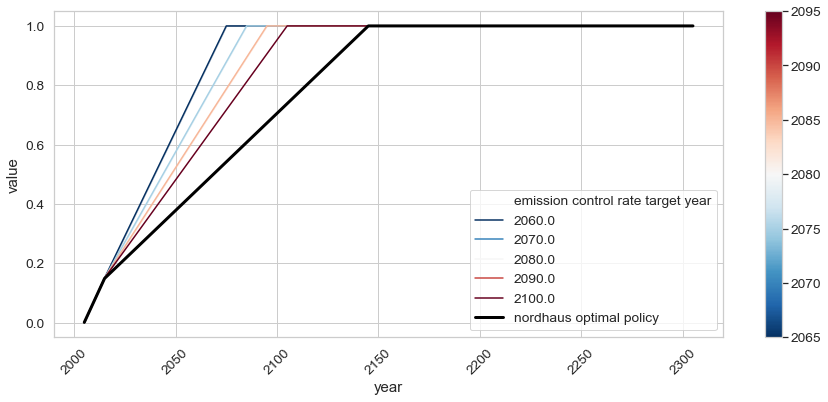

In [202]:
sns.set(font_scale=1.25)  # crazy big
sns.set_style("whitegrid")

plt.figure(figsize=(15, 6))
plt.xticks(rotation=45)
ax = sns.lineplot(x=output.year.astype(float), y="value",label = None, hue="emission control rate target year", palette='RdBu_r', data=output)

ax.plot(nordhaus.year, nordhaus['miu'], color='black',linewidth=3,label = "nordhaus optimal policy")

norm = plt.Normalize(output["emission control rate target year"].min(), output["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
plt.legend()
ax.figure.colorbar(sm)

plt.show()

In [196]:
nordhaus

,year,miu,impact,income,population under treshold,distance to treshold,intertemporal utility,intertemporal impact,intra impact,intra consumption,global output,worldwide emissions,period utility global,global damages,temp_atm
0,2005,0.000415,0.000980,0.389919,524.319045,0.141524,0.369033,0.491654,0.585386,0.505547,0.000000,9.567636,-1070.654524,0.000000,0.830000
1,2015,0.148556,0.008163,0.691963,189.258700,0.356425,0.369033,0.491654,0.568593,0.433054,81.009176,9.726659,667.743977,0.245626,0.980000
2,2025,0.214051,0.011595,0.877597,227.539761,0.323883,0.369033,0.491654,0.562394,0.419838,111.752715,10.166511,1492.441361,0.487449,1.196959
3,2035,0.279547,0.015279,1.243212,265.114464,0.116144,0.369033,0.491654,0.558169,0.405447,148.171906,10.368132,2216.694928,0.905594,1.436645
4,2045,0.345043,0.019545,1.704938,0.000000,0.000000,0.369033,0.491654,0.558917,0.391946,189.604644,10.309960,2721.480345,1.554466,1.681077
5,2055,0.410539,0.024233,2.293577,0.000000,0.000000,0.369033,0.491654,0.559710,0.370812,233.932649,9.942458,2998.636040,2.463498,1.917717
6,2065,0.476034,0.029136,3.003614,0.000000,0.000000,0.369033,0.491654,0.559234,0.350798,280.871401,9.342635,3074.455354,3.654978,2.137915
7,2075,0.541530,0.034074,3.805019,0.000000,0.000000,0.369033,0.491654,0.559813,0.332367,331.589362,8.594485,3025.190694,5.160336,2.336334
8,2085,0.607026,0.038931,4.701737,0.000000,0.000000,0.369033,0.491654,0.562274,0.315366,386.274372,7.719059,2898.439818,6.992235,2.510075
9,2095,0.672521,0.043689,5.693945,0.000000,0.000000,0.369033,0.491654,0.565449,0.299702,444.963552,6.725265,2733.415586,9.148797,2.657689


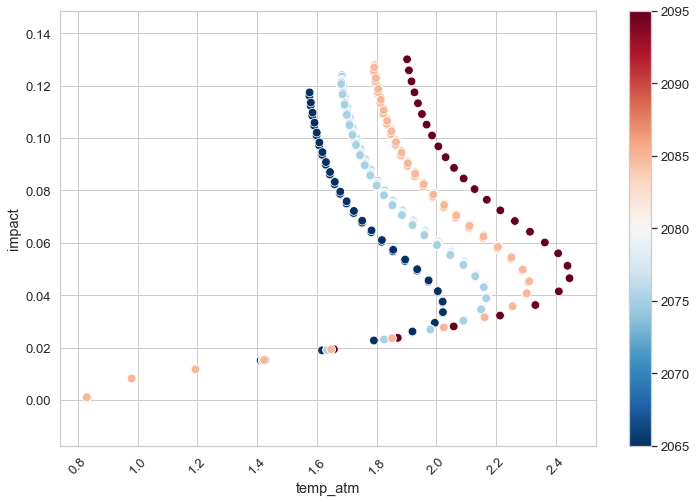

In [197]:
sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

plt.figure(figsize=(12, 8))
plt.xticks(rotation=45)
ax = sns.scatterplot(x='temp_atm', y="impact",s=75,label = None, hue="emission control rate target year", palette='RdBu_r', data=df_merged)

#ax.plot(nordhaus_miu.year, nordhaus_miu['value'], color='black',linewidth=3,label = "nordhaus optimal policy")

norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

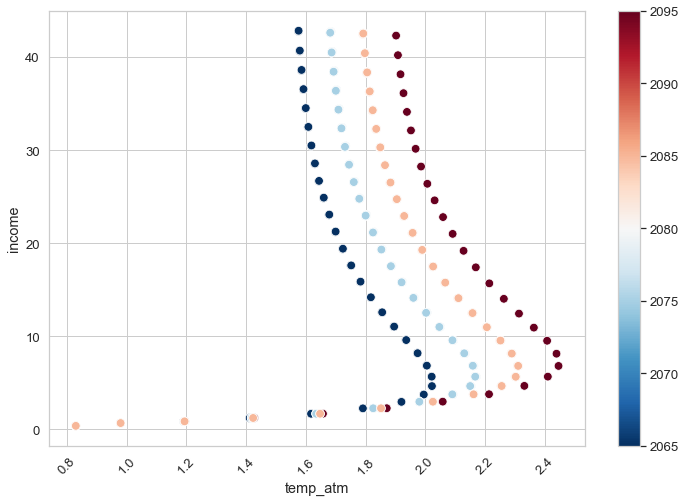

In [198]:
sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

plt.figure(figsize=(12, 8))
plt.xticks(rotation=45)
ax = sns.scatterplot(x='temp_atm', y="income",s=75,label = None, hue="emission control rate target year", palette='RdBu_r', data=df_merged)

#ax.plot(nordhaus_miu.year, nordhaus_miu['value'], color='black',linewidth=3,label = "nordhaus optimal policy")

norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

In [113]:
data_nordhaus = nordhaus[nordhaus["year"]==2055]
data_nordhaus["impact"].values[0]

0.024233262276753632

### Scatterplot of prioritarian objectives over time

In [ ]:
df_merged

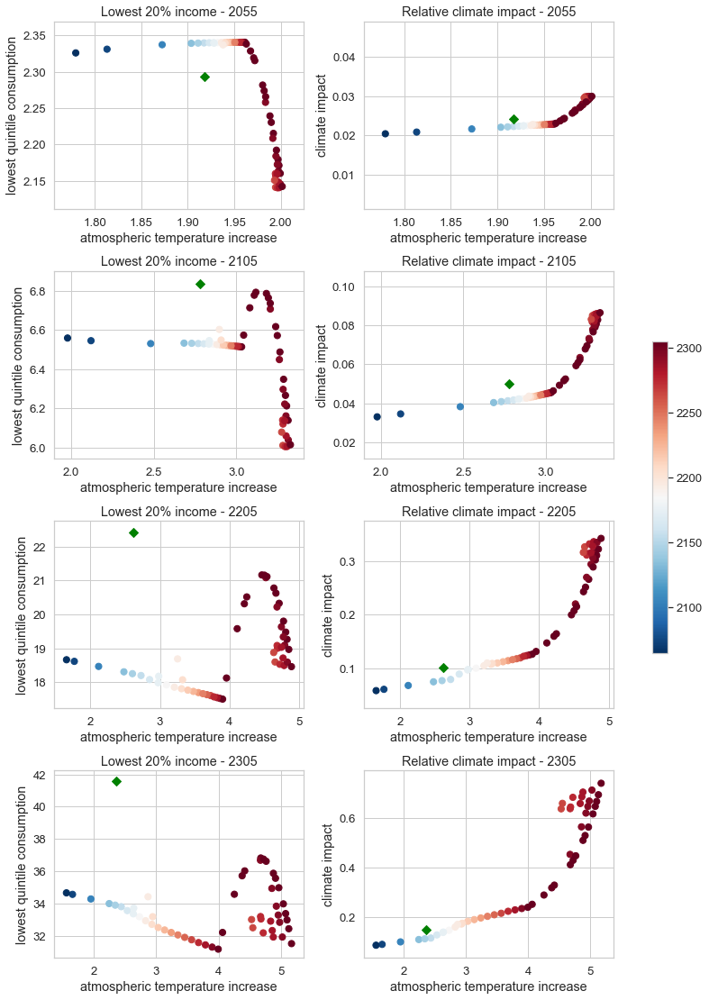

In [114]:
sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16))
#fig.suptitle("Comparison of savings rate", fontsize=15)
fig.tight_layout(pad=3.0)
year = ["2055","2105","2205","2305"]

row_index = 0
colum_index = 0 
norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)

for i in year:
    colum_index = 0
    data_to_plot = df_merged[df_merged["year"]==i]
    data_nordhaus = nordhaus[nordhaus["year"]==int(i)]
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="income",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="income",s=50,color="green",marker="D",data=data_nordhaus)

    axes[row_index,colum_index].set_title('Lowest 20% income - ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='lowest quintile consumption')
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])))
    #axes[row_index,colum_index].annotate("nordhaus",xy =((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])),ha='center')
    
    #xy=(x_values[i], y_values[i]), ha='center'
    colum_index = 1
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="impact",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="impact",s=50,c="green",marker="D",data=data_nordhaus)
    
    axes[row_index,colum_index].set_title('Relative climate impact - ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='climate impact')
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["impact"].values[0])))

    row_index = row_index + 1
    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.35, 0.02, 0.3])

fig.colorbar(sm, cax=cbar_ax,shrink=3)
#clb.ax.set_title('This is a title')

#plt.savefig("validation_savings_rate.png", dpi=300)

### Scatterplot of sufficitarian objectives over time

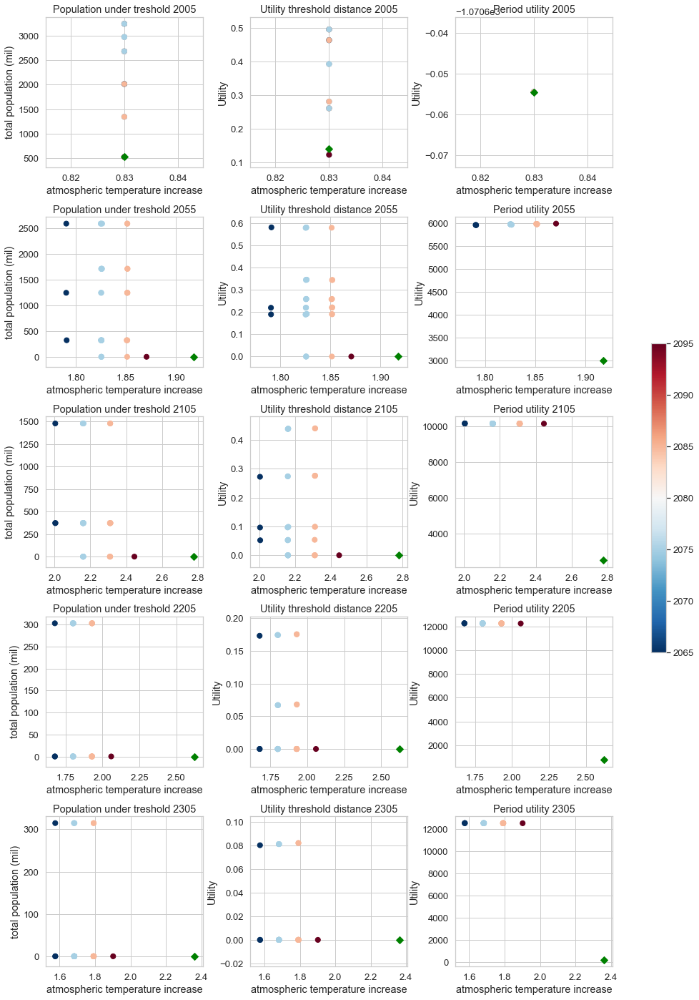

In [199]:

sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20))
#fig.suptitle("Comparison of savings rate", fontsize=15)
fig.tight_layout(pad=3.0)
year = ["2005","2055","2105","2205","2305"]

row_index = 0
colum_index = 0 
norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)

for i in year:
    colum_index = 0
    data_to_plot = df_merged[df_merged["year"]==i]
    data_nordhaus = nordhaus[nordhaus["year"]==int(i)]
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="population",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="population under treshold",s=50,color="green",marker="D",data=data_nordhaus)

    axes[row_index,colum_index].set_title('Population under treshold ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='total population (mil)')
    
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])))
    #axes[row_index,colum_index].annotate("nordhaus",xy =((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])),ha='center') 
    #xy=(x_values[i], y_values[i]), ha='center'
    colum_index = 1
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="distance",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="distance to treshold",s=50,c="green",marker="D",data=data_nordhaus)
    
    axes[row_index,colum_index].set_title('Utility threshold distance ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='Utility')
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["impact"].values[0])))

    colum_index = 2
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="period_utility",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="period utility global",s=50,c="green",marker="D",data=data_nordhaus)
    
    axes[row_index,colum_index].set_title('Period utility ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='Utility')
    row_index = row_index + 1
    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.35, 0.02, 0.3])

fig.colorbar(sm, cax=cbar_ax,shrink=3)
#clb.ax.set_title('This is a title')

#plt.savefig("validation_savings_rate.png", dpi=300)


        



## Scatters egalitarian objectives

In [ ]:
nordhaus.head()

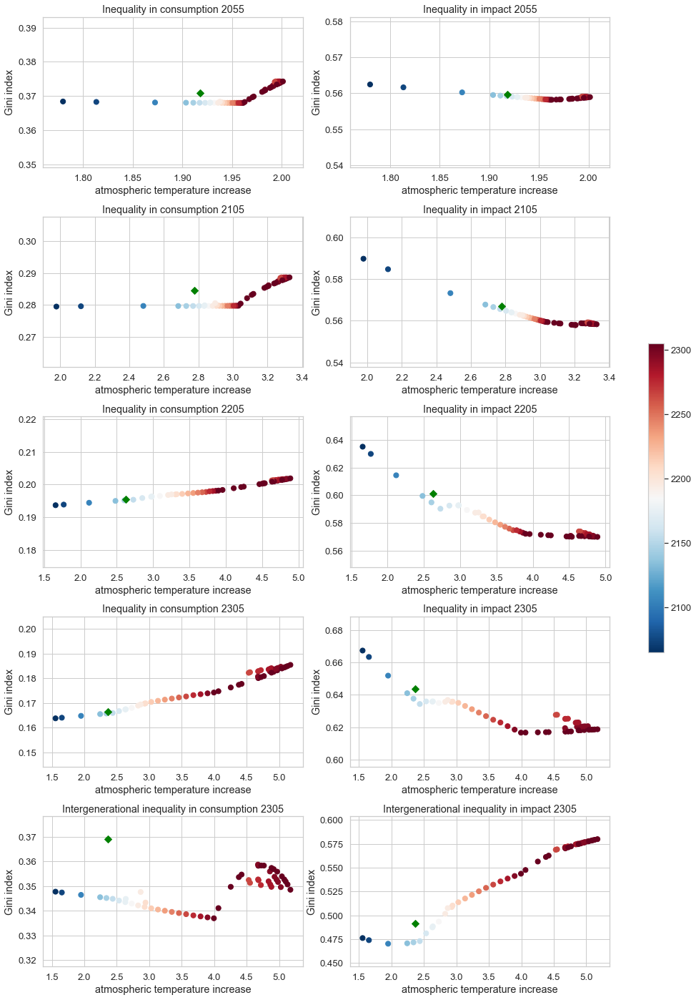

In [116]:

sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
#fig.suptitle("Comparison of savings rate", fontsize=15)
fig.tight_layout(pad=3.0)
year = ["2055","2105","2205","2305"]

row_index = 0
colum_index = 0 
norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)

for i in year:
    colum_index = 0
    data_to_plot = df_merged[df_merged["year"]==i]
    data_nordhaus = nordhaus[nordhaus["year"]==int(i)]
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="gini_intra_con",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="intra consumption",s=50,color="green",marker="D",data=data_nordhaus)

    axes[row_index,colum_index].set_title('Inequality in consumption ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='Gini index')
    
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])))
    #axes[row_index,colum_index].annotate("nordhaus",xy =((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])),ha='center')
    
    #xy=(x_values[i], y_values[i]), ha='center'
    colum_index = 1
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="gini_intra_impact",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="intra impact",s=50,c="green",marker="D",data=data_nordhaus)
    
    axes[row_index,colum_index].set_title('Inequality in impact ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='Gini index')
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["impact"].values[0])))
    
    row_index = row_index + 1

#plot bottom intergenerational ginis 
axes[4,0].scatter(x='temp_atm', y="gini_inter_con",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
axes[4,0].scatter(x='temp_atm', y="intertemporal utility",s=50,c="green",marker="D",data=data_nordhaus)
    
axes[4,0].set_title('Intergenerational inequality in consumption ' + str(i))
axes[4,0].set(xlabel='atmospheric temperature increase', ylabel='Gini index')

#plot bottom intergenerational ginis 
axes[4,1].scatter(x='temp_atm', y="gini_inter_impact",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
axes[4,1].scatter(x='temp_atm', y="intertemporal impact",s=50,c="green",marker="D",data=data_nordhaus)
    
axes[4,1].set_title('Intergenerational inequality in impact ' + str(i))
axes[4,1].set(xlabel='atmospheric temperature increase', ylabel='Gini index')

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.35, 0.02, 0.3])

fig.colorbar(sm, cax=cbar_ax,shrink=3)
#clb.ax.set_title('This is a title')

#plt.savefig("validation_savings_rate.png", dpi=300)


        



## Utilitarian objectives

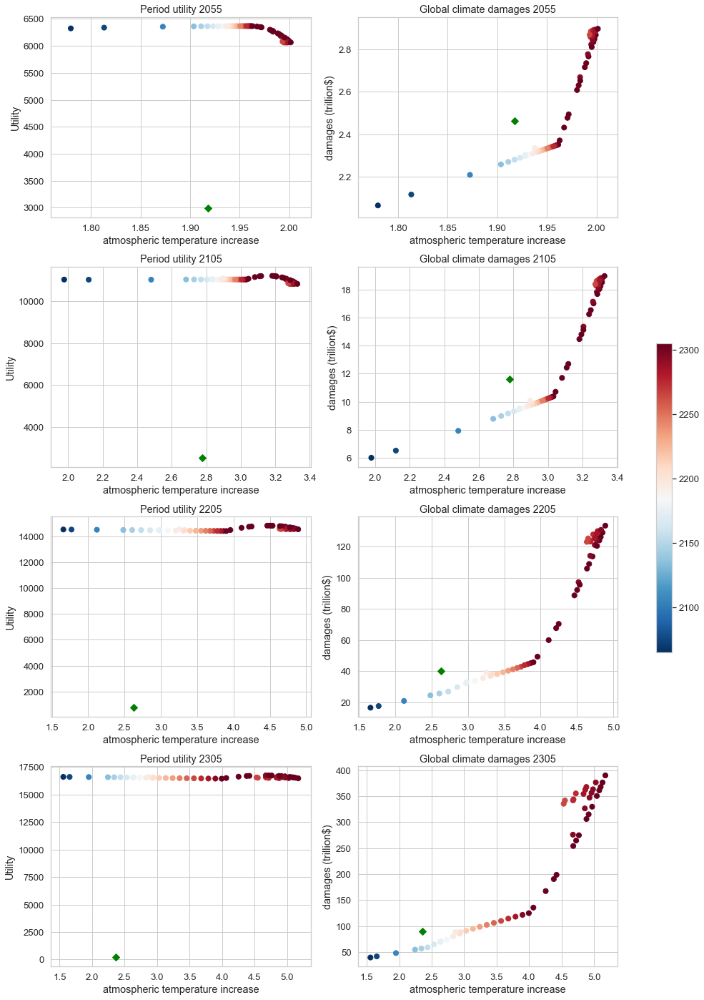

In [117]:
sns.set(font_scale=1.2)  # crazy big
sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
#fig.suptitle("Comparison of savings rate", fontsize=15)
fig.tight_layout(pad=3.0)
year = ["2055","2105","2205","2305"]

row_index = 0
colum_index = 0 
norm = plt.Normalize(df_merged["emission control rate target year"].min(), df_merged["emission control rate target year"].max())
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=norm)

for i in year:
    colum_index = 0
    data_to_plot = df_merged[df_merged["year"]==i]
    data_nordhaus = nordhaus[nordhaus["year"]==int(i)]
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="period_utility",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="period utility global",s=50,color="green",marker="D",data=data_nordhaus)

    axes[row_index,colum_index].set_title('Period utility ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='Utility')
    
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])))
    #axes[row_index,colum_index].annotate("nordhaus",xy =((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["income"].values[0])),ha='center')
    
    #xy=(x_values[i], y_values[i]), ha='center'
    colum_index = 1
    
    axes[row_index,colum_index].scatter(x='temp_atm', y="damages",s=50,c="emission control rate target year", cmap='RdBu_r',data=data_to_plot)
    axes[row_index,colum_index].scatter(x='temp_atm', y="global damages",s=50,c="green",marker="D",data=data_nordhaus)
    
    axes[row_index,colum_index].set_title('Global climate damages ' + str(i))
    axes[row_index,colum_index].set(xlabel='atmospheric temperature increase', ylabel='damages (trillion$)')
    #axes[row_index,colum_index].annotate("nordhaus",((data_nordhaus["temp_atm"].values[0]),(data_nordhaus["impact"].values[0])))
    
    row_index = row_index + 1

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.35, 0.02, 0.3])

fig.colorbar(sm, cax=cbar_ax,shrink=3)
#clb.ax.set_title('This is a title')

#plt.savefig("validation_savings_rate.png", dpi=300)


        

